# **Bima Bayu Saputra** || **Kompi 17** || **SC61720**

# **Import Library**

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import warnings
from sklearn.preprocessing import LabelEncoder
from scipy.stats import skew, norm
from scipy.stats.mstats import winsorize

In [2]:
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=UserWarning)

# **Data Preparation**

## **Load Dataset**

In [2]:
filepath1 = 'https://raw.githubusercontent.com/BimaBayuUWUUU/DSAI_Batch6_Code/main/Dataset/train.csv'

In [3]:
df1 = pd.read_csv(filepath1)

In [4]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [5]:
df1.head(5)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


### **Konversi tipe data**

Karena beberapa kolom merupakan kolom `nominal` dan `ordinal` dengan tipe data `numerik` maka diperlukan konversi tipe data tersebut ke dalam tipe data `category`. Selain itu perlu dirubah juga kolom `objec`t menjadi tipe data `category`. Hal ini berdasarkan informasi yang didapat dari deskripsi data yang terlampir pada datset bahwa semua kolom dengan tipe data object adalah data yang memiliki kategori.

In [6]:
df_fix = df1.copy()
df_fix[['MSSubClass', 'OverallQual', 'OverallCond']] = df1[['MSSubClass', 'OverallQual', 'OverallCond']].astype('category')

In [7]:
for col in df_fix.select_dtypes(include=['object']):
    df_fix[col] = df_fix[col].astype('category')

In [8]:
df_fix.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   Id             1460 non-null   int64   
 1   MSSubClass     1460 non-null   category
 2   MSZoning       1460 non-null   category
 3   LotFrontage    1201 non-null   float64 
 4   LotArea        1460 non-null   int64   
 5   Street         1460 non-null   category
 6   Alley          91 non-null     category
 7   LotShape       1460 non-null   category
 8   LandContour    1460 non-null   category
 9   Utilities      1460 non-null   category
 10  LotConfig      1460 non-null   category
 11  LandSlope      1460 non-null   category
 12  Neighborhood   1460 non-null   category
 13  Condition1     1460 non-null   category
 14  Condition2     1460 non-null   category
 15  BldgType       1460 non-null   category
 16  HouseStyle     1460 non-null   category
 17  OverallQual    1460 non-null   ca

## **Mencari missing value dan mengatasi missing value jika ada.**

### **Menemukan Missing Value**

In [9]:
def display_null_columns(df):
    null_values = df.isnull()

    null_count = null_values.sum()
    
    null_columns = null_count[null_count > 0]

    if not null_columns.empty:
        print("Kolom yang memiliki nilai null, jumlah null, dan tipe data kolomnya:")
        null_info = pd.concat([null_columns, df[null_columns.index].dtypes], axis=1)
        null_info.columns = ['Jumlah Null', 'Tipe Data']
        print(null_info)
    else:
        print("Tidak ada nilai null dalam DataFrame.")

In [10]:
display_null_columns(df_fix)

Kolom yang memiliki nilai null, jumlah null, dan tipe data kolomnya:
              Jumlah Null Tipe Data
LotFrontage           259   float64
Alley                1369  category
MasVnrType            872  category
MasVnrArea              8   float64
BsmtQual               37  category
BsmtCond               37  category
BsmtExposure           38  category
BsmtFinType1           37  category
BsmtFinType2           38  category
Electrical              1  category
FireplaceQu           690  category
GarageType             81  category
GarageYrBlt            81   float64
GarageFinish           81  category
GarageQual             81  category
GarageCond             81  category
PoolQC               1453  category
Fence                1179  category
MiscFeature          1406  category


### **Memperbaiki Mising Value pada data Ketegorik**

#### Data yang memang memiliki kelas **None** atau **NA**.

1. Alley
2. MasVnrType
3. BsmtQual
4. BsmtCond
5. BsmtExposure
6. BsmtFinType1
7. BsmtFinType2
8. FireplaceQu
9. GarageType
10. GarageFinish
11. GarageQual
12. GarageCond
13. PoolQC
14. Fence
15. MiscFeature

#### Data yang tidak memiliki kelas **None** atau **NA**.


1. MSZoning
2. Utilities
3. Exterior1st
4. Exterior2nd
5. Electrical
6. KitchenQual
7. Functional
8. SaleType

#### Mengubah nilai **None** atau **NA** menjadi **Without**.

Hal ini dilakukan karena sesuai deksripsi data memang ada kolom kategori dengan kelas **None** atau **NA** yang berarti tidak memiliki fasilitas tersebut.

In [11]:
def replace_nan_with_without(df, columns):
    df_copy = df.copy()
    for col in columns:
        if 'Without' not in df_copy[col].cat.categories:
            df_copy[col] = df_copy[col].cat.add_categories('Without')
        df_copy[col] = df_copy[col].fillna('Without')
    return df_copy

In [12]:
columns_to_update = [
    'Alley', 'MasVnrType', 'BsmtQual', 'BsmtCond', 'BsmtExposure',
    'BsmtFinType1', 'BsmtFinType2', 'FireplaceQu', 'GarageType',
    'GarageFinish', 'GarageQual', 'GarageCond', 'PoolQC', 'Fence',
    'MiscFeature'
]

df_modified = replace_nan_with_without(df_fix, columns_to_update)

In [13]:
display_null_columns(df_modified)

Kolom yang memiliki nilai null, jumlah null, dan tipe data kolomnya:
             Jumlah Null Tipe Data
LotFrontage          259   float64
MasVnrArea             8   float64
Electrical             1  category
GarageYrBlt           81   float64


#### Memperbaiki Missing Value pada data String tanpa kategorikal **NA/None** menggunkana **modus**

In [14]:
def fill_na_with_mode(df, columns_to_fill):
    
    df_copy = df.copy()
    for col in columns_to_fill:
        mode_value = df_copy[col].mode()[0] 
        df_copy[col] = df_copy[col].fillna(mode_value)
        
    return df_copy

In [15]:
columns_to_fill = ['Electrical']

df_filled = fill_na_with_mode(df_modified, columns_to_fill)

In [16]:
display_null_columns(df_filled)

Kolom yang memiliki nilai null, jumlah null, dan tipe data kolomnya:
             Jumlah Null Tipe Data
LotFrontage          259   float64
MasVnrArea             8   float64
GarageYrBlt           81   float64


### **Memperbaiki Mising Value pada data Numerik**

#### Mengisi menggunakan **mean**. 

In [17]:
def fill_null_with_mean(df, columns_with_null):
    df_copy = df.copy()
    for col in columns_with_null:
        df_copy[col] = df_copy[col].fillna(df[col].median())
        
    return df_copy

In [18]:

columns_with_null = ['LotFrontage', 'MasVnrArea', 'GarageYrBlt']
df_missing_fixed = fill_null_with_mean(df_filled, columns_with_null)

In [19]:
display_null_columns(df_missing_fixed)

Tidak ada nilai null dalam DataFrame.


In [20]:
df_missing_fixed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   Id             1460 non-null   int64   
 1   MSSubClass     1460 non-null   category
 2   MSZoning       1460 non-null   category
 3   LotFrontage    1460 non-null   float64 
 4   LotArea        1460 non-null   int64   
 5   Street         1460 non-null   category
 6   Alley          1460 non-null   category
 7   LotShape       1460 non-null   category
 8   LandContour    1460 non-null   category
 9   Utilities      1460 non-null   category
 10  LotConfig      1460 non-null   category
 11  LandSlope      1460 non-null   category
 12  Neighborhood   1460 non-null   category
 13  Condition1     1460 non-null   category
 14  Condition2     1460 non-null   category
 15  BldgType       1460 non-null   category
 16  HouseStyle     1460 non-null   category
 17  OverallQual    1460 non-null   ca

## **Mencari duplicate value dan menyelesaikan duplicate value jika ada.**

### **Menemukan duplicate value**

In [21]:
def check_duplicate_ids(df):
    duplicate_all= df.duplicated()
    
    duplicate_rows = df[duplicate_all]
    
    if not duplicate_rows.empty:
        print("Ada Data yang duplikat:")
        print(duplicate_rows)
    else:
        print("Tidak ada Data duplikat dalam DataFrame.")

In [22]:
check_duplicate_ids(df_missing_fixed)

Tidak ada Data duplikat dalam DataFrame.


In [23]:
df_fix_duplicate = df_missing_fixed.copy().drop_duplicates()

Duplikasi data tidak ditemukan dalam dataset. Maka tidak perlu dilakukan tindakan apapun.

## **Menentukan Tujuan Preparation Dataset dan Target Column**

Dalam dataset ini, tujuan dari persiapan data adalah untuk mempersiapkan data yang akan digunakan untuk melakukan analisis data dan pemodelan regresi. Target column yang akan digunakan adalah `SalePrice`.

In [24]:
target_columns = ['SalePrice']

## **Memeriksa outlier dan menangani outlier jika ada.**

In [25]:
columns = df_fix_duplicate.select_dtypes(include=['int64', 'float64']).columns

### **Menemukan Outlier**

#### Boxplot

In [26]:
def plot_boxplot(df, target_columns, figsize=(12, 36)):
    num_plots = len(target_columns)
    num_cols = 4 

    num_rows = num_plots // num_cols
    if num_plots % num_cols:
        num_rows += 1

    fig, axes = plt.subplots(num_rows, num_cols, figsize=figsize)

    for i, column in enumerate(target_columns):
        row = i // num_cols
        col = i % num_cols
        ax = axes[row, col] if num_rows > 1 else axes[col]

        sns.boxplot(y=df[column], ax=ax)
        ax.set_title(f'Boxplot {column}')

    for i in range(num_plots, num_rows * num_cols):
        fig.delaxes(axes.flatten()[i])

    plt.tight_layout()
    plt.show()

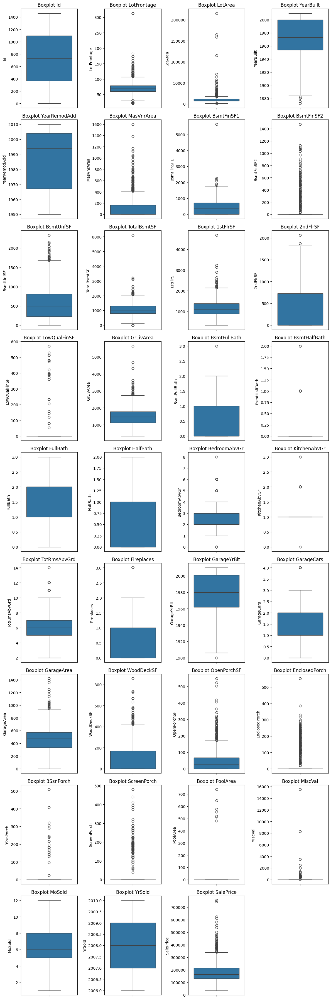

In [27]:
plot_boxplot(df_fix_duplicate, columns)

### **Mengatasi Outlier**

In [28]:
except_columns = ['MiscVal', 'PoolArea', '3SsnPorch', 'KitchenAbvGr', 'LowQualFinSF','BsmtHalfBath', 'ScreenPorch', 'BsmtFinSF2', 'EnclosedPorch']
outlier_columns = columns.drop(except_columns)

#### Mengatasi Outliers dengan Winsorization

Secara singkatnya methode ini akan mengganti nilai outlier dengan nilai maksimum atau minimum yang telah ditentukan.

In [29]:
def transform_outliersW(df, numeric_columns):
    df_copy = df.copy()
    
    for column in numeric_columns:
        q1 = df_copy[column].quantile(0.25)
        q3 = df_copy[column].quantile(0.75)
        iqr = q3 - q1
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr
        
        if (df_copy[column] < lower_bound).any() or (df_copy[column] > upper_bound).any():
            values = df_copy[column].values
            winsorized_data = winsorize(values, limits=[0.05, 0.05])
            df_copy[column] = winsorized_data
        
    return df_copy

In [30]:
df_otcW = transform_outliersW(df_fix_duplicate, outlier_columns)

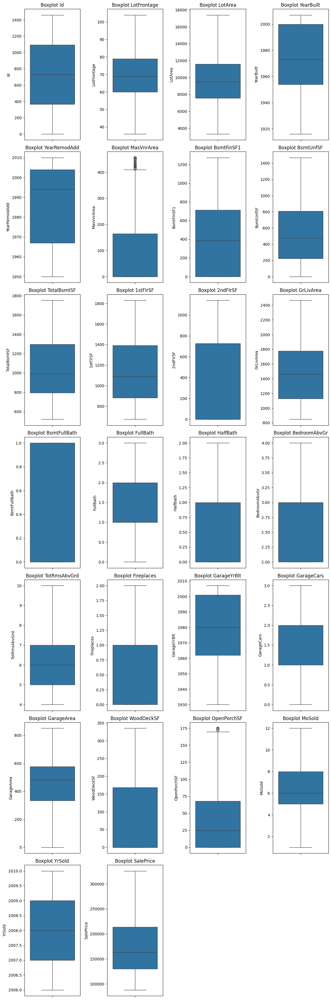

In [31]:
plot_boxplot(df_otcW, outlier_columns)

#### Mengatasi Outliers dengan Capping

Seacar singkatnya methode ini akan mengganti nilai yang berada di luar batas atas dan batas bawah dengan nilai batas atas dan batas bawah tersebut.

In [32]:
def transform_outliersC(df, target_columns):
    df_copy = df.copy()
    
    for column in target_columns:
        q1 = df_copy[column].quantile(0.25)
        q3 = df_copy[column].quantile(0.75)
        iqr = q3 - q1
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr
        
        df_copy[column] = df_copy[column].clip(lower=lower_bound, upper=upper_bound)
        
    return df_copy


In [33]:
df_otcC = transform_outliersC(df_fix_duplicate, outlier_columns)

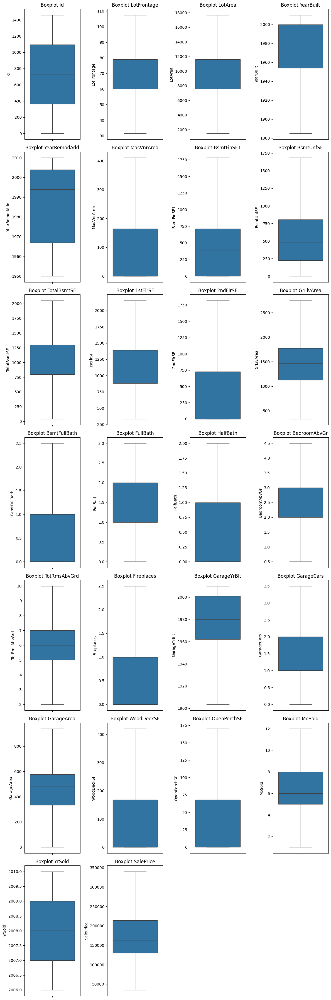

In [34]:
plot_boxplot(df_otcC, outlier_columns)

#### Hasil yang diambil

Metode Winsorization lebih cocok karena:

1. Efektivitas : Mengatasi outliers tanpa menghapus data sepenuhnya.
2. Mempertahankan Ukuran Sampel: Tidak mengurangi ukuran sampel secara signifikan.
3. Menghindari Bias: Mencegah bias yang mungkin terjadi dengan penghapusan data.
4. Fleksibel: Dapat disesuaikan dengan persentase pemotongan yang berbeda.

## **Memeriksa imbalance data dan menyelesaikan imbalance data jika ada.**

In [35]:
df_imbalance = df_otcW.copy()

### **Mencari Imbalance Data**

#### Histogram

In [36]:
def plot_numeric_columns_histogram_subplots(data, target_columns):
    if isinstance(target_columns, str):
        target_columns = [target_columns] 
        num_plots = 1 
    else:
        num_plots = len(target_columns)

    num_cols = 4
    num_rows = num_plots // num_cols
    if num_plots % num_cols:
        num_rows += 1

    fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(36, 8))
    
    if isinstance(axes, np.ndarray):
        axes = axes.flatten()
    else:
        axes = [axes]

    for i, column in enumerate(target_columns):
        ax = axes[i]
        sns.histplot(data[column], kde=True, ax=ax, color='skyblue')
        ax.set_title(f'Histogram of {column}')
        ax.set_xlabel(column)
        ax.set_ylabel('Frequency')
        ax.grid(False)
    
    for i in range(num_plots, num_rows * num_cols):
        plt.delaxes(axes[i])
    
    plt.tight_layout()
    plt.show()


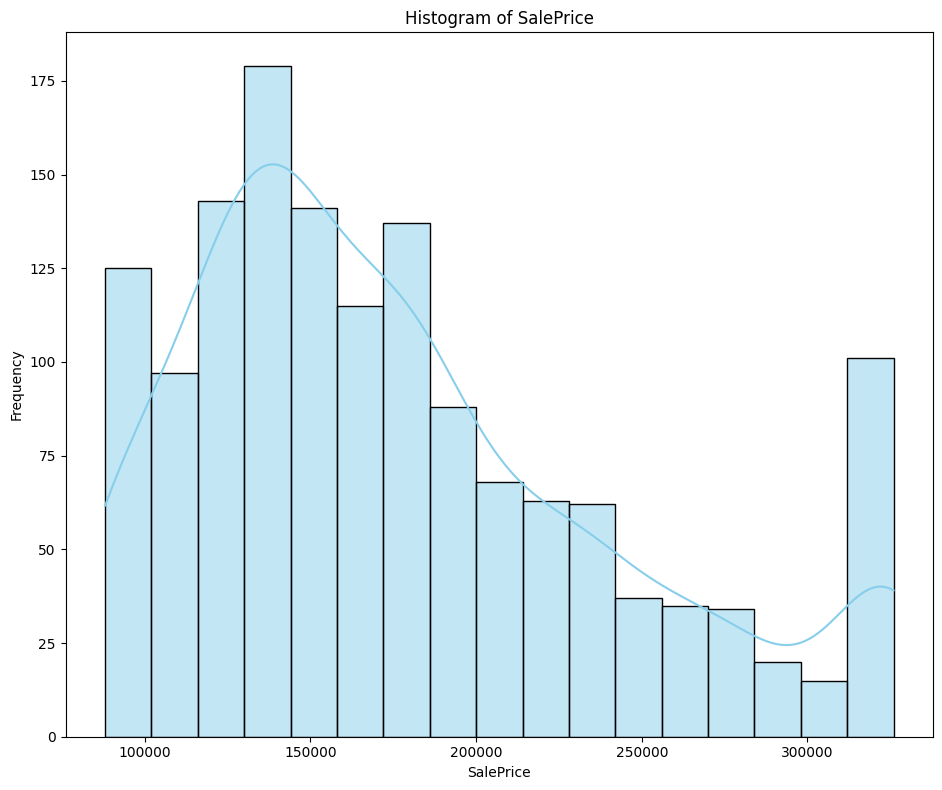

In [37]:
plot_numeric_columns_histogram_subplots(df_imbalance, target_columns)

#### Hitung Rasio Kelas Minoritas:Mayoritas

In [38]:
def calculate_class_imbalance_auto(df, columns, num_bins=10):
    categorical_columns = []
    continuous_columns = []

    for column in columns:
        if pd.api.types.is_categorical_dtype(df[column]) or pd.api.types.is_string_dtype(df[column]):
            categorical_columns.append(column)
        elif pd.api.types.is_numeric_dtype(df[column]):
            continuous_columns.append(column)

    imbalance_data = []

    for column in categorical_columns:
        class_counts = df[column].value_counts()
        minority_class_count = class_counts.min()
        majority_class_count = class_counts.max()
        imbalance_ratio = minority_class_count / majority_class_count
        imbalance_data.append([column, imbalance_ratio])

    for column in continuous_columns:
        bins = np.linspace(df[column].min(), df[column].max(), num_bins+1)
        categories = pd.cut(df[column], bins=bins, include_lowest=True)
        
        class_counts = categories.value_counts()
        
        minority_bin_count = class_counts.min()
        majority_bin_count = class_counts.max()
        imbalance_ratio = minority_bin_count / majority_bin_count

        imbalance_data.append([column, imbalance_ratio])

    imbalance_df = pd.DataFrame(imbalance_data, columns=['Column', 'Imbalance Ratio'])
    return imbalance_df


In [39]:
calculate_class_imbalance_auto(df_otcW, target_columns)

C:\Users\HP Pavilion\AppData\Local\Temp\ipykernel_18968\3361507851.py:6: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(df[column]) or pd.api.types.is_string_dtype(df[column]):


,Column,Imbalance Ratio
0,SalePrice,0.131783


### **Mengatasi Masalah Imbalance Data**

**Tidak diperlukan balancing data karena dataset dipersiapkan untuk model regresi. Sehingga tidak perlu mengatasi imbalance data karena regresi sendiri tidak bergantung pada kelas-kelas dalam fitur.**

## **Membuat class Encoder dan Decoder**

In [40]:
class AutoLabelEncoder:
    def __init__(self):
        self.encoders = {}

    def fit_transform(self, df):
        for column in df.columns:
            if df[column].dtype == 'category':
                encoder = LabelEncoder()
                df[column] = encoder.fit_transform(df[column])
                self.encoders[column] = {label: index for index, label in enumerate(encoder.classes_)}
        return df
    
    def transform(self, df):
        for column, encoder in self.encoders.items():
            if column in df.columns:
                df[column] = df[column].map(encoder).fillna(df[column])
        return df

    def inverse_transform(self, df):
        for column, encoder in self.encoders.items():
            if column in df.columns:
                reverse_encoder = {v: k for k, v in encoder.items()}
                df[column] = df[column].map(reverse_encoder).fillna(df[column])
        return df


In [47]:
auto_encoder = AutoLabelEncoder()
encoded_df = auto_encoder.fit_transform(df_imbalance.copy())

# **Exploratory Data Analysis (EDA)**

## **Load Dataset**

In [49]:
data_eda = df_otcW

## **Mengelaborasi Features dan Tipe Data**

In [50]:
data_eda.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,Without,Reg,Lvl,AllPub,...,0,Without,Without,Without,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,Without,Reg,Lvl,AllPub,...,0,Without,Without,Without,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,Without,IR1,Lvl,AllPub,...,0,Without,Without,Without,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,Without,IR1,Lvl,AllPub,...,0,Without,Without,Without,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,Without,IR1,Lvl,AllPub,...,0,Without,Without,Without,0,12,2008,WD,Normal,250000


In [51]:
data_eda.tail()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1455,1456,60,RL,62.0,7917,Pave,Without,Reg,Lvl,AllPub,...,0,Without,Without,Without,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,Without,Reg,Lvl,AllPub,...,0,Without,MnPrv,Without,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,Without,Reg,Lvl,AllPub,...,0,Without,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,Without,Reg,Lvl,AllPub,...,0,Without,Without,Without,0,4,2010,WD,Normal,142125
1459,1460,20,RL,75.0,9937,Pave,Without,Reg,Lvl,AllPub,...,0,Without,Without,Without,0,6,2008,WD,Normal,147500


In [52]:
print("Informasi Dataset:")
data_eda.info()

Informasi Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   Id             1460 non-null   int64   
 1   MSSubClass     1460 non-null   category
 2   MSZoning       1460 non-null   category
 3   LotFrontage    1460 non-null   float64 
 4   LotArea        1460 non-null   int64   
 5   Street         1460 non-null   category
 6   Alley          1460 non-null   category
 7   LotShape       1460 non-null   category
 8   LandContour    1460 non-null   category
 9   Utilities      1460 non-null   category
 10  LotConfig      1460 non-null   category
 11  LandSlope      1460 non-null   category
 12  Neighborhood   1460 non-null   category
 13  Condition1     1460 non-null   category
 14  Condition2     1460 non-null   category
 15  BldgType       1460 non-null   category
 16  HouseStyle     1460 non-null   category
 17  OverallQual   

### **Korelasi Features**

In [53]:
# Hitung korelasi Pearson
sales_corr = encoded_df.corr()

In [54]:
sales_corr

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
Id,1.000000,0.018745,-0.006096,-0.029920,-0.005952,0.008916,-0.001530,0.032122,-0.019659,0.013324,...,0.057044,-0.033928,-0.000399,0.037057,-0.006242,0.021172,0.000712,0.019773,-0.005806,-0.027520
MSSubClass,0.018745,1.000000,0.037785,-0.336639,-0.332512,-0.025737,-0.094916,0.090920,-0.007658,-0.026217,...,0.020837,-0.015024,0.074567,0.033339,-0.006062,0.007052,-0.022100,0.020195,-0.033097,-0.054703
MSZoning,-0.006096,0.037785,1.000000,-0.123917,-0.080355,0.087654,-0.052039,0.061887,-0.017854,-0.001192,...,-0.003128,0.002882,-0.061289,0.000673,0.009293,-0.031496,-0.020628,0.097437,0.009494,-0.208875
LotFrontage,-0.029920,-0.336639,-0.123917,1.000000,0.565205,-0.038488,0.167287,-0.138406,-0.007430,-0.000183,...,0.071585,-0.085744,-0.051995,-0.011099,0.002888,0.017479,0.006378,-0.043993,0.063964,0.376146
LotArea,-0.005952,-0.332512,-0.080355,0.565205,1.000000,-0.071402,0.111307,-0.300796,-0.058019,0.035422,...,0.101766,-0.100447,0.008224,-0.058047,0.056315,0.002504,-0.035450,-0.012891,0.050154,0.436556
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MoSold,0.021172,0.007052,-0.031496,0.017479,0.002504,0.003690,0.013094,-0.033455,-0.011599,-0.051552,...,-0.033737,0.036368,-0.009892,-0.014193,-0.006495,1.000000,-0.145721,-0.047386,0.013320,0.069022
YrSold,0.000712,-0.022100,-0.020628,0.006378,-0.035450,-0.025043,0.020944,0.036449,0.020507,0.023353,...,-0.059689,0.060904,-0.035366,-0.055962,0.004906,-0.145721,1.000000,-0.002327,0.003880,-0.028968
SaleType,0.019773,0.020195,0.097437,-0.043993,-0.012891,0.014339,0.008205,-0.000911,-0.025754,-0.126770,...,0.011009,-0.013592,-0.006154,-0.003311,0.015773,-0.047386,-0.002327,1.000000,0.184067,-0.044484
SaleCondition,-0.005806,-0.033097,0.009494,0.063964,0.050154,0.006064,0.035717,-0.038118,0.033809,-0.089701,...,-0.067251,0.097425,0.100675,0.003192,0.013027,0.013320,0.003880,0.184067,1.000000,0.227129


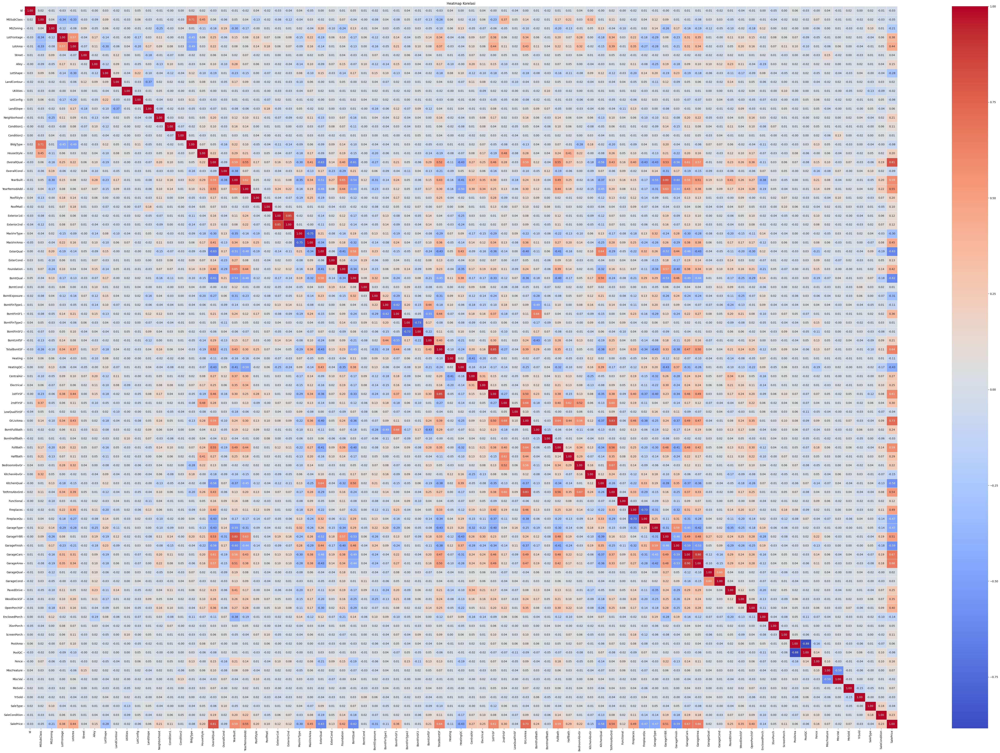

In [55]:
plt.figure(figsize=(72, 48))
sns.heatmap(sales_corr, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Heatmap Korelasi')
plt.show()

In [56]:
high_corr_columns = sales_corr[(sales_corr > 0.7) & (sales_corr < 1)]

for col1 in high_corr_columns.index:
    for col2 in high_corr_columns.index:
        if col1 != col2 and sales_corr.loc[col1, col2] > 0.7:
            print(f"{col1} dan {col2} memiliki korelasi: {sales_corr.loc[col1, col2]}")

MSSubClass dan BldgType memiliki korelasi: 0.7124744102567905
BldgType dan MSSubClass memiliki korelasi: 0.7124744102567905
OverallQual dan SalePrice memiliki korelasi: 0.812369458889186
YearBuilt dan GarageYrBlt memiliki korelasi: 0.7988083089432334
Exterior1st dan Exterior2nd memiliki korelasi: 0.8541629837325787
Exterior2nd dan Exterior1st memiliki korelasi: 0.8541629837325787
TotalBsmtSF dan 1stFlrSF memiliki korelasi: 0.8513693143327102
1stFlrSF dan TotalBsmtSF memiliki korelasi: 0.8513693143327102
GrLivArea dan TotRmsAbvGrd memiliki korelasi: 0.8327039641030668
GrLivArea dan SalePrice memiliki korelasi: 0.7270458733276692
TotRmsAbvGrd dan GrLivArea memiliki korelasi: 0.8327039641030668
GarageYrBlt dan YearBuilt memiliki korelasi: 0.7988083089432334
GarageCars dan GarageArea memiliki korelasi: 0.8994870933524486
GarageArea dan GarageCars memiliki korelasi: 0.8994870933524486
SalePrice dan OverallQual memiliki korelasi: 0.812369458889186
SalePrice dan GrLivArea memiliki korelasi: 0

### **Univariate Analysis**

#### **Numerical Features**

In [57]:
def plot_numeric_columns_histogram_subplots(data):
    numeric_columns = data.select_dtypes(include='number').columns
    num_plots = len(numeric_columns)
    num_cols = 4
    num_rows = num_plots // num_cols
    if num_plots % num_cols:
        num_rows += 1
    fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(30, 60))
    
    for i, column in enumerate(numeric_columns):
        row = i // num_cols
        col = i % num_cols
        ax = axes[row, col]
        
        sns.histplot(data[column], kde=True, ax=ax, color='skyblue')
        ax.set_title(f'Histogram of {column}')
        ax.set_xlabel(column)
        ax.set_ylabel('Frequency')
        ax.grid(False)
    
    for i in range(num_plots, num_rows * num_cols):
        plt.delaxes(plt.subplot(num_rows, num_cols, i + 1))
    
    plt.show()

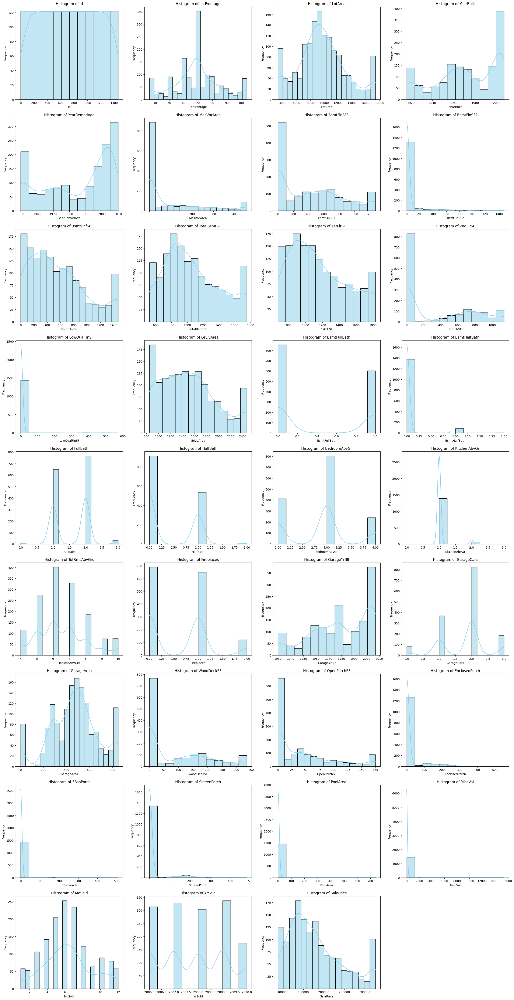

In [58]:
plot_numeric_columns_histogram_subplots(data_eda)

#### **Categorical Features**

In [59]:
def plot_categorical_histograms(df, figsize=(40, 86)): 
    num_cols = 3
    object_columns = df.select_dtypes(include='category').columns
    num_plots = len(object_columns)
    num_rows = num_plots // num_cols
    if num_plots % num_cols:
        num_rows += 1

    fig = plt.figure(figsize=figsize)
    plot_count = 0 
    
    for i, column in enumerate(object_columns):
        if df[column].nunique() > 10:
            figsize_custom = (24, 12)
            plt.figure(figsize=figsize_custom)
            sns.countplot(data=df, x=column, color='skyblue')
            plt.title(f'Count Plot {column}')
            plt.tight_layout()
            continue  
        else:
            plot_count += 1
            ax = fig.add_subplot(num_rows, num_cols, plot_count)
            sns.countplot(data=df, x=column, ax=ax, color='skyblue')
            ax.set_title(f'Count Plot {column}')       
    for i in range(num_plots, num_rows * num_cols):
        plt.delaxes(plt.subplot(num_rows, num_cols, i + 1))
        
    plt.tight_layout()
    plt.show()

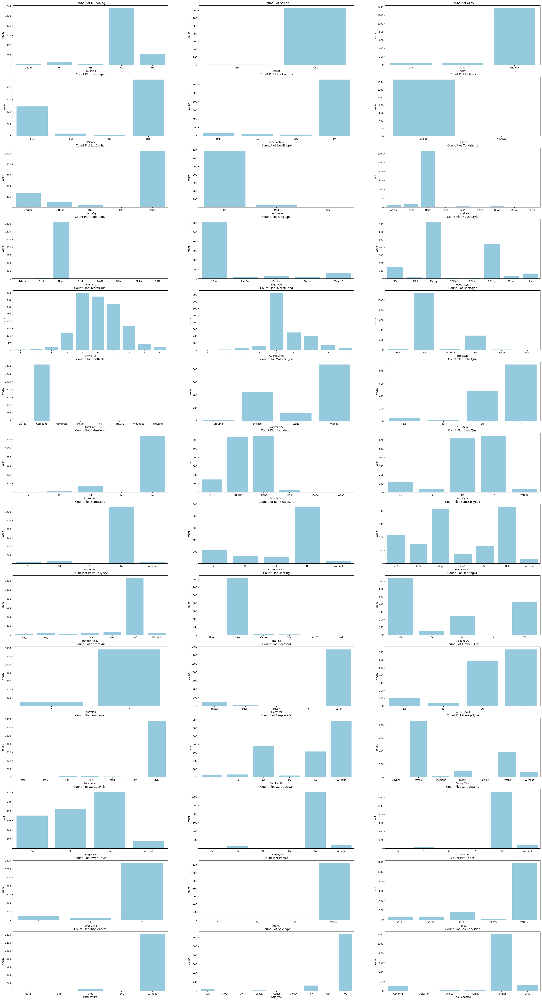

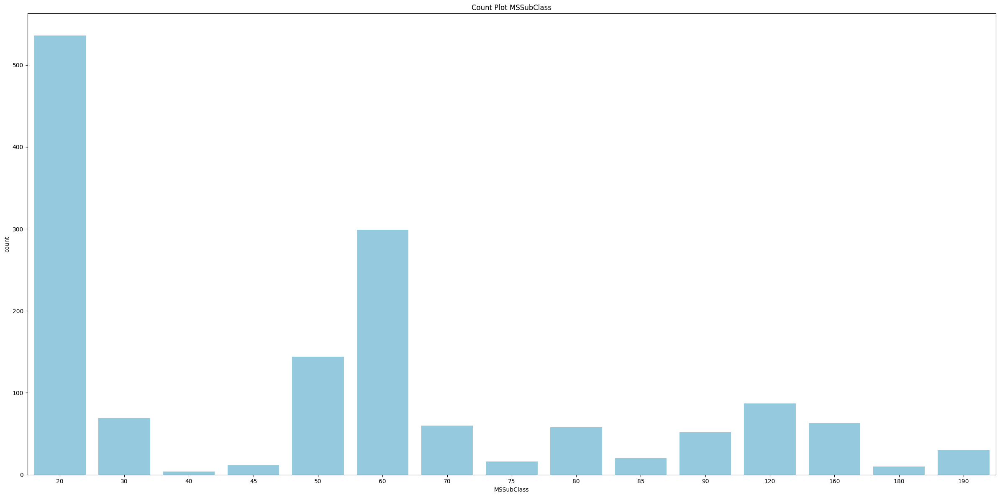

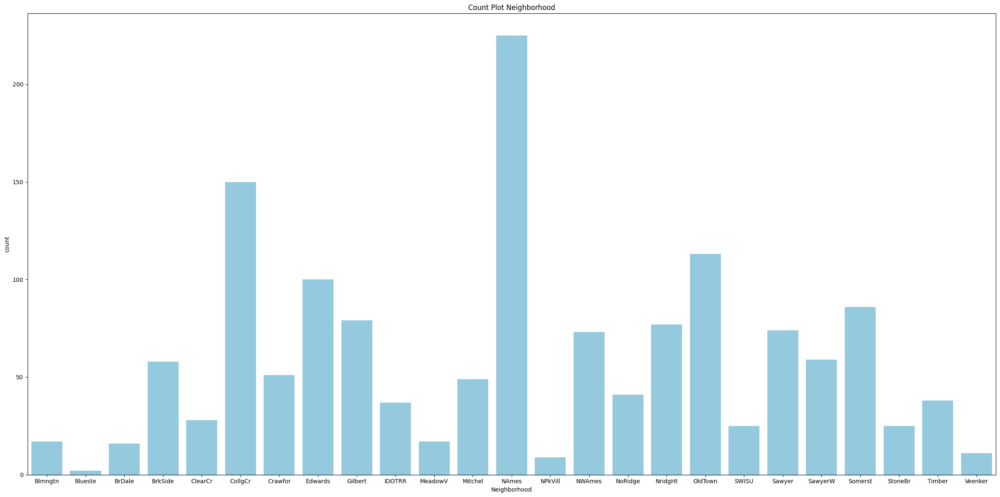

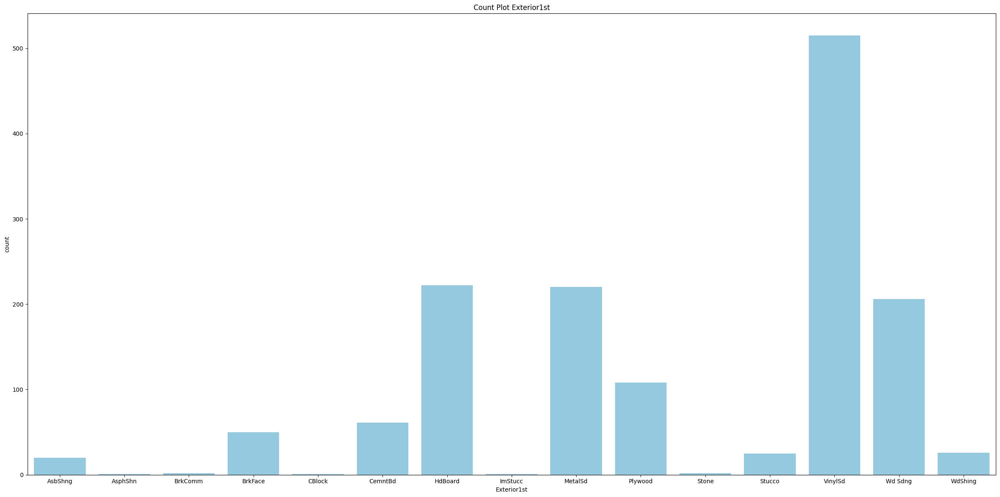

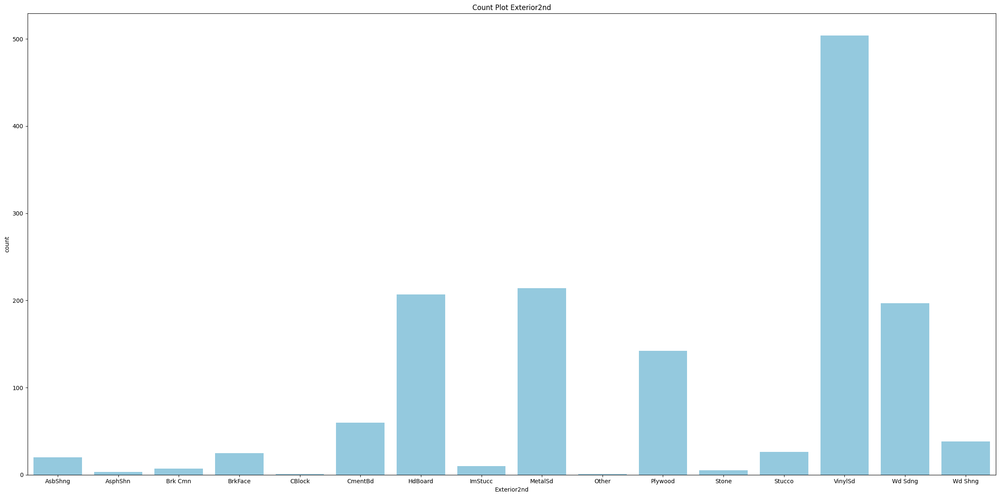

In [60]:
plot_categorical_histograms(data_eda)

### **Bi/Mul Variate Analysis**

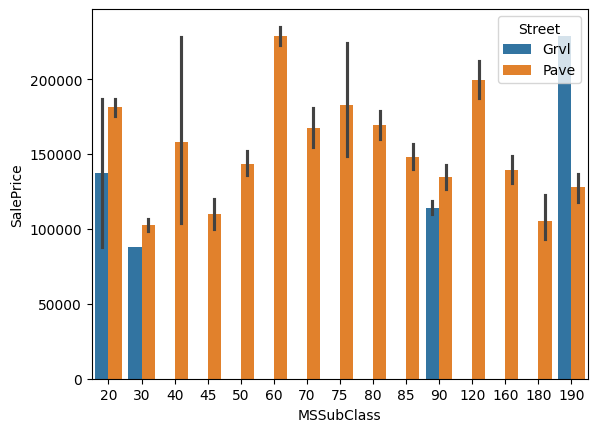

In [61]:
ax = sns.barplot(x="MSSubClass", y="SalePrice", hue="Street", data=data_eda)

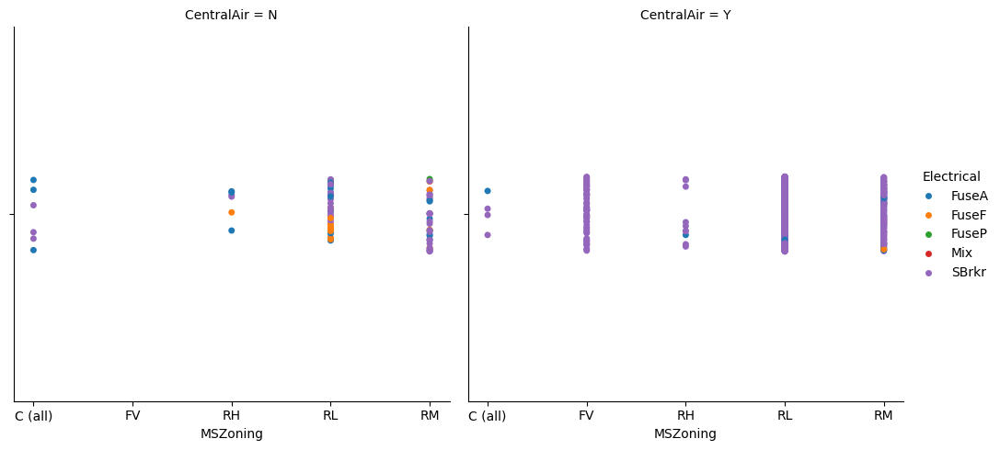

In [62]:
ax = sns.catplot(x='MSZoning', data=data_eda, col='CentralAir', hue='Electrical')

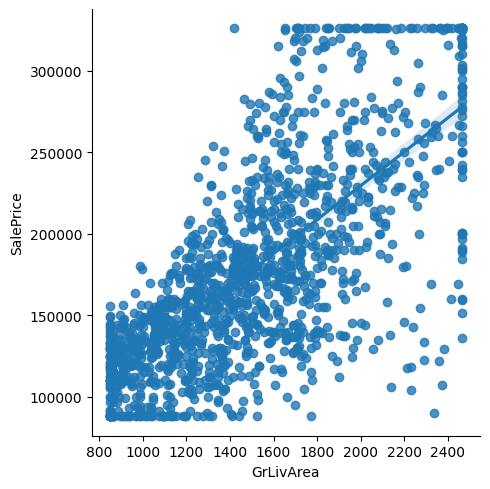

In [63]:
ax = sns.lmplot(x="GrLivArea", y="SalePrice", data=data_eda,)

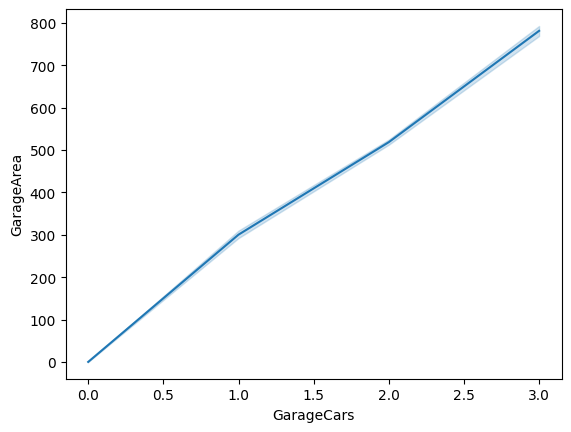

In [64]:
ax = sns.lineplot(x="GarageCars", y="GarageArea", data=data_eda)

## **Mean, Median, dan Modus**

`Mean`, `median`, dan `modus` adalah tiga metrik statistik yang digunakan untuk menggambarkan data secara deskriptif.

- **Mean** adalah jumlah dari semua nilai dalam kumpulan data dibagi dengan total jumlah nilai. `Mean` sering digunakan sebagai ukuran pusat yang paling umum, namun rentan terhadap pengaruh nilai ekstrem atau outlier. Jika ada outlier, mean dapat menjadi tidak representatif. Meskipun demikian, `mean` cocok digunakan untuk data yang terdistribusi normal atau mendekati normal.

- **Median** adalah nilai tengah dalam kumpulan data setelah diurutkan secara berurutan. `Median` tidak dipengaruhi oleh nilai ekstrem atau outlier, sehingga lebih stabil daripada `mean`. Karena itu, `median` lebih disukai untuk data yang memiliki distribusi yang miring (skewed) atau ketika ada nilai ekstrem.

- **Modus** adalah nilai yang paling sering muncul dalam kumpulan data. `Modus` dapat memiliki lebih dari satu nilai (multi-modal) jika ada beberapa nilai yang memiliki frekuensi yang sama. `Modus` berguna terutama untuk data kategorikal, tetapi juga dapat diterapkan pada data numerik.

Perbedaan utama antara ketiganya terletak pada cara mereka menangani nilai ekstrem dan distribusi data. `Mean` dapat dipengaruhi oleh nilai ekstrem, `median` lebih tahan terhadap nilai ekstrem, sementara `modus` hanya memperhatikan nilai yang paling sering muncul tanpa memperhatikan nilai numerik secara keseluruhan.


### **Data Numerik**

In [65]:
numeric_columns = df_otcC.select_dtypes(include=['int', 'float']).columns

modus_func = lambda x: x.mode().iloc[0]

aggregate_stats = df_otcC[numeric_columns].agg(['mean', 'median'])
aggregate_stats.loc['modus'] = df_otcC[numeric_columns].apply(modus_func)

print("Statistik Agregat:")
aggregate_stats

Statistik Agregat:


,Id,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
mean,730.5,69.090411,9647.388014,1971.299315,1984.865753,89.406336,439.997517,46.549315,563.77774,1050.254795,...,91.806849,42.603425,21.95411,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,177331.52637
median,730.5,69.000000,9478.500000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.50000,991.500000,...,0.000000,25.000000,0.00000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.00000
modus,1.0,69.000000,17673.500000,2006.000000,1950.000000,0.000000,0.000000,0.000000,0.00000,42.000000,...,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,6.000000,2009.000000,340037.50000


### **Data Kategorikal**

In [66]:
categorical_columns = df_otcC.select_dtypes(include=['category']).columns

modus_func = lambda x: x.mode().iloc[0]

mode_and_frequency = df_otcC[categorical_columns].apply(lambda x: (x.mode().iloc[0], len(x[x == x.mode().iloc[0]])))

print("Modus dan Frekuensi untuk Kolom Kategorikal:")
mode_and_frequency

Modus dan Frekuensi untuk Kolom Kategorikal:


,MSSubClass,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,...,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
0,20,RL,Pave,Without,Reg,Lvl,AllPub,Inside,Gtl,NAmes,...,Attchd,Unf,TA,TA,Y,Without,Without,Without,WD,Normal
1,536,1151,1454,1369,925,1311,1459,1052,1382,225,...,870,605,1311,1326,1340,1453,1179,1406,1267,1198


## **Statistical Five Summaries**


Statistical Five Summaries adalah alat analisis data eksploratif yang memberikan insight tentang distribusi nilai untuk suatu fitur. Secara kolektif, kumpulan statistik ini menjelaskan di mana nilai-nilai data terjadi, kecenderungan pusat, variabilitas, dan bentuk umum distribusinya.

### **Data Numerik**

In [67]:
print("\nLima Ringkasan Statistik untuk Fitur Numerik:")
data_eda.describe().loc[['min', '25%', '50%', '75%', 'max']]


Lima Ringkasan Statistik untuk Fitur Numerik:


c:\Users\HP Pavilion\.conda\envs\tf\lib\site-packages\numpy\lib\function_base.py:4824: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  arr.partition(
c:\Users\HP Pavilion\.conda\envs\tf\lib\site-packages\numpy\lib\function_base.py:4824: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  arr.partition(
c:\Users\HP Pavilion\.conda\envs\tf\lib\site-packages\numpy\lib\function_base.py:4824: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  arr.partition(
c:\Users\HP Pavilion\.conda\envs\tf\lib\site-packages\numpy\lib\function_base.py:4824: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  arr.partition(
c:\Users\HP Pavilion\.conda\envs\tf\lib\site-packages\numpy\lib\function_base.py:4824: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  arr.partition(
c:\Users\HP Pavilion\.conda\envs\tf\lib\site-packages\numpy\lib\function_base.py:4824: UserWarn

,Id,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
min,1.00,36.0,3316.0,1916.0,1950.0,0.00,0.00,0.0,0.0,520.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2006.0,88000.0
25%,365.75,60.0,7553.5,1954.0,1967.0,0.00,0.00,0.0,223.0,795.75,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,2007.0,129975.0
50%,730.50,69.0,9478.5,1973.0,1994.0,0.00,383.50,0.0,477.5,991.50,...,0.0,25.0,0.0,0.0,0.0,0.0,0.0,6.0,2008.0,163000.0
75%,1095.25,79.0,11601.5,2000.0,2004.0,164.25,712.25,0.0,808.0,1298.25,...,168.0,68.0,0.0,0.0,0.0,0.0,0.0,8.0,2009.0,214000.0
max,1460.00,104.0,17400.0,2007.0,2010.0,456.00,1274.00,1474.0,1468.0,1753.00,...,335.0,175.0,552.0,508.0,480.0,738.0,15500.0,12.0,2010.0,326000.0


### **Data Kategorik**

In [68]:
print("\nEmpat Ringkasan Statistik untuk Fitur Kategorial:")
data_eda.describe(include=["category"])


Empat Ringkasan Statistik untuk Fitur Kategorial:


,MSSubClass,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,...,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
count,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,...,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460
unique,15,5,2,3,4,4,2,5,3,25,...,7,4,6,6,3,4,5,5,9,6
top,20,RL,Pave,Without,Reg,Lvl,AllPub,Inside,Gtl,NAmes,...,Attchd,Unf,TA,TA,Y,Without,Without,Without,WD,Normal
freq,536,1151,1454,1369,925,1311,1459,1052,1382,225,...,870,605,1311,1326,1340,1453,1179,1406,1267,1198


## **Distribusi Data**

### **Standar Deviasi**

In [69]:
data_eda.describe().loc[['std']]

c:\Users\HP Pavilion\.conda\envs\tf\lib\site-packages\numpy\lib\function_base.py:4824: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  arr.partition(
c:\Users\HP Pavilion\.conda\envs\tf\lib\site-packages\numpy\lib\function_base.py:4824: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  arr.partition(
c:\Users\HP Pavilion\.conda\envs\tf\lib\site-packages\numpy\lib\function_base.py:4824: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  arr.partition(
c:\Users\HP Pavilion\.conda\envs\tf\lib\site-packages\numpy\lib\function_base.py:4824: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  arr.partition(
c:\Users\HP Pavilion\.conda\envs\tf\lib\site-packages\numpy\lib\function_base.py:4824: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  arr.partition(
c:\Users\HP Pavilion\.conda\envs\tf\lib\site-packages\numpy\lib\function_base.py:4824: UserWarn

,Id,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
std,421.610009,16.503986,3469.444734,28.872129,20.645407,140.590668,412.214952,161.319273,414.582219,346.847701,...,109.391899,53.137989,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,64551.108307


### **Visualisasi**

In [70]:
def plot_distribution_plot_subplots(data):
    numeric_columns = data.select_dtypes(include='number').columns
    num_plots = len(numeric_columns)
    num_cols = 3
    num_rows = num_plots // num_cols
    if num_plots % num_cols:
        num_rows += 1
    fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(24, 96))
    
    for i, column in enumerate(numeric_columns):
        row = i // num_cols
        col = i % num_cols
        ax = axes[row, col]
        
        sns.kdeplot(data[column], ax=ax, color='skyblue', fill=True)
        ax.set_title(f'Distribusi {column}')
        ax.set_xlabel(column)
        ax.set_ylabel('Density')
        ax.grid(False)
    
    for i in range(num_plots, num_rows * num_cols):
        plt.delaxes(plt.subplot(num_rows, num_cols, i + 1))
    
    plt.show()


Visualisasi Distribusi Data dari Setiap Kolom:


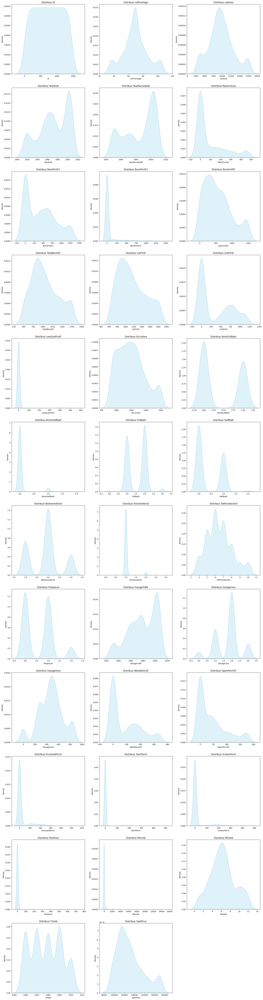

In [71]:
print("\nVisualisasi Distribusi Data dari Setiap Kolom:")
plot_distribution_plot_subplots(data_eda)

### **Memeriksa Distribusi Fitur**

In [66]:
for nama_kolom in data_eda.select_dtypes(include='number').columns:
    print(f"{nama_kolom}")
    
    # Hitung skewness
    skewness = skew(data_eda[nama_kolom])
    print(f"Skewness: {skewness}")


    p_value = norm.sf(abs(skewness))
    if p_value < 0.05:
        print(f"Skewness dari {nama_kolom} signifikan (p-value={p_value}), menunjukkan distribusi tidak normal.")
    else:
        print(f"Skewness dari {nama_kolom} tidak signifikan (p-value={p_value}), menunjukkan distribusi normal.")

    print("\n")

Id
Skewness: 0.0
Skewness dari Id tidak signifikan (p-value=0.5), menunjukkan distribusi normal.


LotFrontage
Skewness: 0.11242459971057116
Skewness dari LotFrontage tidak signifikan (p-value=0.4552433756106172), menunjukkan distribusi normal.


LotArea
Skewness: 0.31233436352585764
Skewness dari LotArea tidak signifikan (p-value=0.3773932135242946), menunjukkan distribusi normal.


YearBuilt
Skewness: -0.44224844191989515
Skewness dari YearBuilt tidak signifikan (p-value=0.32915471773241045), menunjukkan distribusi normal.


YearRemodAdd
Skewness: -0.5030444967597948
Skewness dari YearRemodAdd tidak signifikan (p-value=0.3074664940394669), menunjukkan distribusi normal.


MasVnrArea
Skewness: 1.3937494017550265
Skewness dari MasVnrArea tidak signifikan (p-value=0.08169664619837869), menunjukkan distribusi normal.


BsmtFinSF1
Skewness: 0.5409206038974297
Skewness dari BsmtFinSF1 tidak signifikan (p-value=0.2942811543554712), menunjukkan distribusi normal.


BsmtFinSF2
Skewness: 4.250

# **Feature Engineering**

## **Load Dataset**

In [72]:
# Membaca dataset
data = df_otcW.copy()

## **Pembuatan Fitur Baru**

### **Agregasi**

In [73]:
# Fitur baru: TotalBuildingSF
data['TotalBuildingSF'] = data['1stFlrSF'] + data['2ndFlrSF'] + data['TotalBsmtSF']


Insight: 
* Fitur ini menunjukkan total luas bangunan yang terdiri dari luas lantai pertama, lantai kedua, dan luas basement.
* Semakin besar nilai TotalBuildingSF, semakin besar ukuran keseluruhan bangunan.

In [74]:
# Fitur baru: TotalBathrooms
data['TotalBathrooms'] = (data['FullBath'] + data['HalfBath']) + (data['BsmtFullBath'] + data['BsmtHalfBath'])

Insight: 
* Fitur ini menunjukkan jumlah total kamar mandi di atas dan di bawah grade.
* Semakin besar nilai TotalBathrooms, semakin banyak kamar mandi yang tersedia di properti tersebut.

In [75]:
# Fitur baru: TotalStreetFrontage
outdoor_features = ['LotFrontage','WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch']
data['TotalStreetFrontage'] = data[outdoor_features].sum(axis=1)

Insight: 
* Fitur ini menunjukkan total panjang garis depan properti, termasuk panjang garis depan dari garasi dan teras.
* Semakin besar nilai TotalStreetFrontage, semakin besar panjang garis depan properti.

In [76]:
# Fitur baru: MainFloorBathrooms
data['MainFloorBathrooms'] = data['FullBath'] + data['HalfBath']

Insight: 
* Fitur ini menunjukkan jumlah total kamar mandi di lantai pertama.
* Mengetahui jumlah kamar mandi di lantai pertama dapat memberikan gambaran tentang kenyamanan dan fungsionalitas rumah.

In [77]:
# Fitur baru: MainFloorRatio
data['MainFloorRatio'] = data['1stFlrSF'] / data['TotalBuildingSF']

Insight: 
* Fitur ini menunjukkan rasio antara luas lantai pertama dengan total luas bangunan.
* Rasio yang lebih tinggi menunjukkan proporsi yang lebih besar dari bangunan yang berada di lantai pertama.

In [78]:
# Fitur baru: LivingAreaPerRoom
data['LivingAreaPerRoom'] = data['GrLivArea'] / data['TotRmsAbvGrd']

Insight: 
* Fitur ini menunjukkan rata-rata luas area tinggal per ruangan di atas grade.
* Semakin besar nilai LivingAreaPerRoom, semakin besar ruang yang tersedia per ruangan.

In [79]:
# Fitur baru: GarageAreaPerCar
data['GarageAreaPerCar'] = data['GarageArea'] / data['GarageCars']
data['GarageAreaPerCar'] = data['GarageAreaPerCar'].fillna(0)

Insight
* Fitur ini menunjukkan rata-rata luas gudang per mobil.
* Semakin besar nilai GarageAreaPerCar, semakin banyak ruang yang tersedia untuk setiap mobil di gudang.

### **Transformasi**

In [80]:
# Fitur baru: PropertyAge
data['PropertyAge'] = data['YrSold'] - data['YearBuilt']

Insight
* Fitur ini menunjukkan usia properti pada saat penjualan.
* Semakin besar nilai PropertyAge, semakin tua properti tersebut.

In [81]:
# Fitur baru: GarageAge
data['GarageAge'] = data['YrSold'] - data['GarageYrBlt']

Insight
* Fitur ini menunjukkan usia garasi pada saat penjualan.
* Semakin besar nilai GarageAge, semakin tua garasi tersebut.

In [82]:
# Fitur baru: PorchType
porch_types = []
for index, row in data.iterrows():
    if row['OpenPorchSF'] > 0 or row['EnclosedPorch'] > 0:
        porch_types.append('Covered')
    elif row['ScreenPorch'] > 0:
        porch_types.append('Screened')
    else:
        porch_types.append('Without')

data['PorchType'] = porch_types
data['PorchType'] = data['PorchType'].astype('category')

Insight: 
* Fitur ini menunjukkan jenis teras yang dimiliki oleh properti, apakah tertutup (Covered), terlindungi(Screened), atau tanpa teras (Without).
* Mengetahui jenis teras dapat memberikan gambaran tentang ruang outdoor yang tersedia dan tingkat kenyamanan untuk beraktivitas di luar ruangan.

### **Ekstraksi**

In [83]:
# Fitur baru: Remodeled
data['Remodeled'] = (data['YearBuilt'] != data['YearRemodAdd']).astype(int)

Insight:
* Fitur ini menunjukkan apakah rumah telah direnovasi sebelum penjualan atau tidak.
* Mengetahui apakah rumah telah direnovasi dapat memberikan informasi tambahan tentang kondisi dan nilai properti.

In [84]:
# Fitur baru: BuildingRating
data['BuildingRating'] = np.ceil((data['OverallQual'].astype(int) + data['OverallCond'].astype(int)) / 2).astype(int)


Insight: 
* Fitur ini menunjukkan penilaian keseluruhan rumah, dihitung sebagai nilai rata-rata dari OverallQual dan OverallCond, yang dibulatkan ke atas.
* Semakin tinggi nilai BuildingRating, semakin tinggi penilaian bangunan rumah.

### **Tampilkan**

In [80]:
data.iloc[:, -15:]

,SaleType,SaleCondition,SalePrice,TotalBuildingSF,TotalBathrooms,TotalStreetFrontage,MainFloorBathrooms,MainFloorRatio,LivingAreaPerRoom,GarageAreaPerCar,PropertyAge,GarageAge,PorchType,Remodeled,BuildingRating
0,WD,Normal,208500,2566,4,126.0,3,0.333593,213.750000,274.000000,5,5.0,Covered,0,6
1,WD,Normal,181500,2524,3,378.0,2,0.500000,210.333333,230.000000,31,31.0,Without,0,7
2,WD,Normal,223500,2706,4,110.0,3,0.339985,297.666667,304.000000,7,7.0,Covered,1,6
3,WD,Abnorml,140000,2473,2,367.0,1,0.388597,245.285714,214.000000,90,8.0,Covered,1,6
4,WD,Normal,250000,3343,4,360.0,3,0.342507,244.222222,278.666667,8,8.0,Covered,0,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,WD,Normal,175000,2600,3,102.0,3,0.366538,235.285714,230.000000,8,8.0,Covered,1,6
1456,WD,Normal,210000,3373,3,420.0,2,0.542840,296.142857,250.000000,32,32.0,Without,1,6
1457,WD,Normal,266500,3481,2,126.0,2,0.341281,260.000000,252.000000,69,69.0,Covered,1,8
1458,WD,Normal,142125,2156,2,515.0,1,0.500000,215.600000,240.000000,60,60.0,Covered,1,6


# **Machine Learning Regression Model**

Seperti yang telah dijelaskan pada Data Preparation, dataset ini akan digunakan untuk membangun model `regresi`. Oleh karena itu, kita akan membandingkan beberapa algoritma regresi untuk memprediksi harga penjualan rumah dengan target column `SalePrice`.

## **Library**

In [81]:
#pip install xgboost

In [85]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score, mean_absolute_error, mean_absolute_percentage_error
from sklearn.linear_model import LinearRegression, HuberRegressor
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor
from sklearn.linear_model import Ridge, Lasso, ElasticNet
import xgboost as xgb
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import KFold, learning_curve, cross_validate
from sklearn.model_selection import GridSearchCV

## **Fixing Outliers Features Engineering**

Perlu dilakukan checking dan handling outliers karena tetap ada indikasi adanya outliers pada fitur hasil FE meskipun dihasilkan dari fitur bersih.

**Catatan:**

Sudah dilakukan percobaan pada dataset dengan data preparation yang menghandling outliers pada semua fitur baik X maupun y memiliki metriks evaluasi yang lebih baik jika dibandingkan dengan hanya handling outliers pada kolom y saja.

### **Pilih Fitur Numerical**

In [86]:
data_columns = ['TotalBuildingSF','TotalBathrooms','TotalStreetFrontage','MainFloorRatio','LivingAreaPerRoom', 'PropertyAge', 'GarageAge', 'GarageAreaPerCar','BuildingRating']

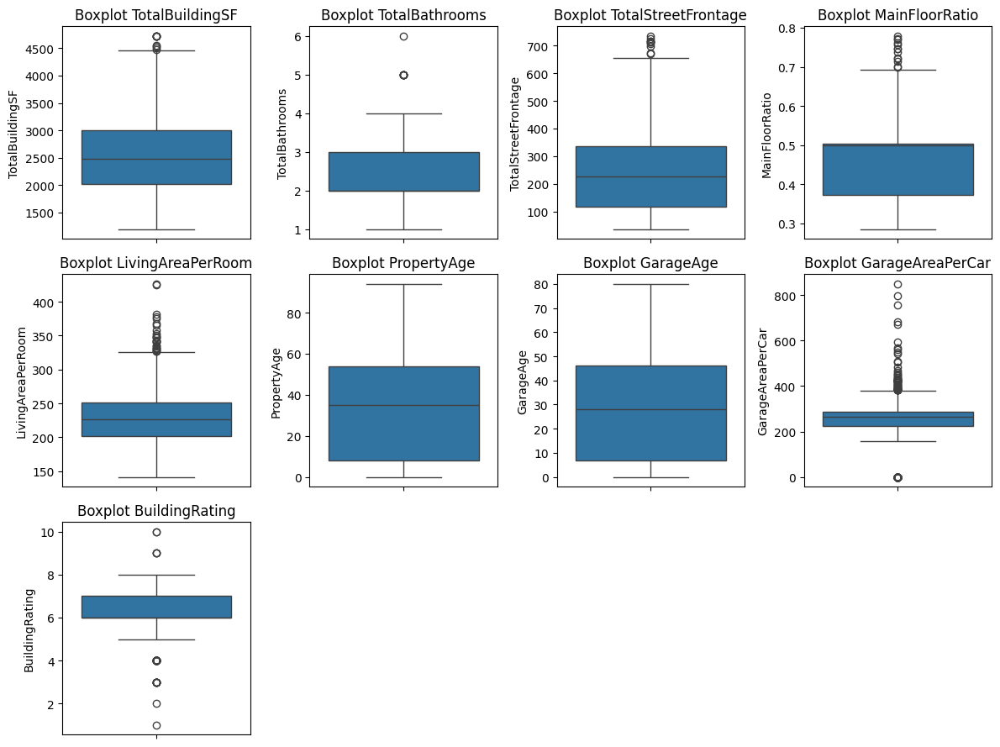

In [87]:
plot_boxplot(data,data_columns, figsize=(12, 9))

### **Mengatasi Outliers dengan Winsorize**

In [88]:
data_fix = transform_outliersW(data, data_columns)

c:\Users\HP Pavilion\.conda\envs\tf\lib\site-packages\numpy\lib\function_base.py:4824: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  arr.partition(
c:\Users\HP Pavilion\.conda\envs\tf\lib\site-packages\numpy\lib\function_base.py:4824: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  arr.partition(
c:\Users\HP Pavilion\.conda\envs\tf\lib\site-packages\numpy\lib\function_base.py:4824: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  arr.partition(
c:\Users\HP Pavilion\.conda\envs\tf\lib\site-packages\numpy\lib\function_base.py:4824: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  arr.partition(
c:\Users\HP Pavilion\.conda\envs\tf\lib\site-packages\numpy\lib\function_base.py:4824: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  arr.partition(
c:\Users\HP Pavilion\.conda\envs\tf\lib\site-packages\numpy\lib\function_base.py:4824: UserWarn

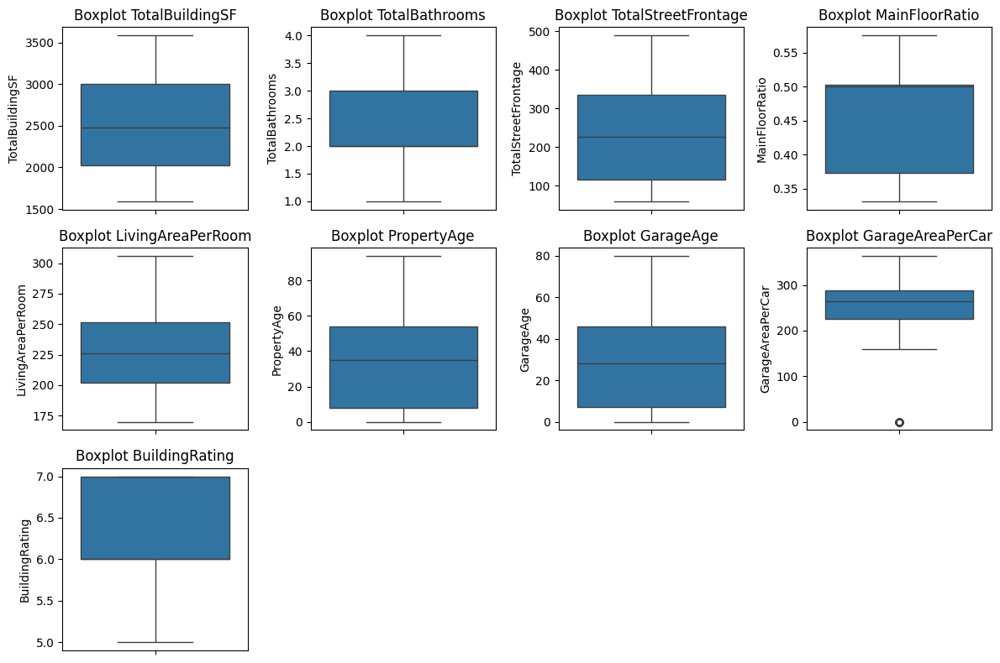

In [89]:
plot_boxplot(data_fix, data_columns, figsize=(12, 8))

Outlier telah diatasi tanpa pengurangan data. Pada fitur `GarageAreaPerCar` masih ditemukan outlier, namun tidak akan dihapus karena setelah diamati hal ini bukan termasuk outlier namun hanya nilai ekstrim.

## **Fixing Data Encoding**

In [90]:
data_fix.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 93 columns):
 #   Column               Non-Null Count  Dtype   
---  ------               --------------  -----   
 0   Id                   1460 non-null   int64   
 1   MSSubClass           1460 non-null   category
 2   MSZoning             1460 non-null   category
 3   LotFrontage          1460 non-null   float64 
 4   LotArea              1460 non-null   int64   
 5   Street               1460 non-null   category
 6   Alley                1460 non-null   category
 7   LotShape             1460 non-null   category
 8   LandContour          1460 non-null   category
 9   Utilities            1460 non-null   category
 10  LotConfig            1460 non-null   category
 11  LandSlope            1460 non-null   category
 12  Neighborhood         1460 non-null   category
 13  Condition1           1460 non-null   category
 14  Condition2           1460 non-null   category
 15  BldgType             

In [91]:
data_encoded = data_fix.copy()

In [41]:
df_otcW.to_excel('House Prices.xlsx', index=False) 

### **Convert to Default Type**

In [89]:
data_encoded[['MSSubClass', 'OverallQual', 'OverallCond']] = data[['MSSubClass', 'OverallQual', 'OverallCond']].astype(int)

Dilakukan untuk mempermudah encoding karena bentuk data sudah berupa numeric namun telah diubah menjadi category dalam proses data preparation.

### **Ordinal Encoding**

In [90]:
ordinal_encoders = {
    "ExterQual": {"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1},
    "ExterCond": {"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1},
    "BsmtQual": {"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1, "Without": 0},
    "BsmtCond": {"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1, "Without": 0},
    "BsmtExposure": {"Gd": 4, "Av": 3, "Mn": 2, "No": 1, "Without": 0},
    "BsmtFinType1": {"GLQ": 6, "ALQ": 5, "BLQ": 4, "Rec": 3, "LwQ": 2, "Unf": 1, "Without": 0},
    "BsmtFinType2": {"GLQ": 6, "ALQ": 5, "BLQ": 4, "Rec": 3, "LwQ": 2, "Unf": 1, "Without": 0},
    "HeatingQC": {"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1},
    "KitchenQual": {"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1},
    "Functional": {"Typ": 8, "Min1": 7, "Min2": 6, "Mod": 5, "Maj1": 4, "Maj2": 3, "Sev": 2, "Sal": 1},
    "FireplaceQu": {"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1, "Without": 0},
    "GarageQual": {"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1, "Without": 0},
    "GarageCond": {"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1, "Without": 0},
    "GarageFinish": {"Fin": 3, "RFn": 2, "Unf": 1, "Without": 0},
    "PoolQC": {"Ex": 4, "Gd": 3, "TA": 2, "Fa": 1, "Without": 0},
    "Fence": {"GdPrv": 4, "MnPrv": 3, "GdWo": 2, "MnWw": 1, "Without": 0},
}

Encoding dilakukan manual karena tidak semua kategori memiliki urutan yang sama.

In [91]:
def apply_ordinal_encoding(data, ordinal_encoders):
    for column, mapping in ordinal_encoders.items():
        if column in data.columns:
            data[column] = data[column].map(mapping)
    return data

df_encoded = apply_ordinal_encoding(data_encoded, ordinal_encoders)

# # List nama kolom yang akan ditampilkan
# kolom_yang_ingin_ditampilkan = list(ordinal_encoders.keys())

# # Tampilkan DataFrame hanya dengan kolom-kolom yang dipilih
# df_subset = data_encoded[kolom_yang_ingin_ditampilkan]
# df_subset

### **Label Encoding**

In [92]:
data_encoded = auto_encoder.fit_transform(data_encoded.copy())

In [93]:
data_encoded

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,TotalStreetFrontage,MainFloorBathrooms,MainFloorRatio,LivingAreaPerRoom,GarageAreaPerCar,PropertyAge,GarageAge,PorchType,Remodeled,BuildingRating
0,1,60,3,65.0,8450,1,2,3,3,0,...,126.0,3,0.333593,213.750000,274.000000,5,5.0,0,0,6
1,2,20,3,80.0,9600,1,2,3,3,0,...,378.0,2,0.500000,210.333333,230.000000,31,31.0,2,0,7
2,3,60,3,68.0,11250,1,2,0,3,0,...,110.0,3,0.339985,297.666667,304.000000,7,7.0,0,1,6
3,4,70,3,60.0,9550,1,2,0,3,0,...,367.0,1,0.388597,245.285714,214.000000,90,8.0,0,1,6
4,5,60,3,84.0,14260,1,2,0,3,0,...,360.0,3,0.342507,244.222222,278.666667,8,8.0,0,0,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,3,62.0,7917,1,2,3,3,0,...,102.0,3,0.366538,235.285714,230.000000,8,8.0,0,1,6
1456,1457,20,3,85.0,13175,1,2,3,3,0,...,420.0,2,0.542840,296.142857,250.000000,32,32.0,2,1,6
1457,1458,70,3,66.0,9042,1,2,3,3,0,...,126.0,2,0.341281,260.000000,252.000000,69,69.0,0,1,7
1458,1459,20,3,68.0,9717,1,2,3,3,0,...,489.0,1,0.500000,215.600000,240.000000,60,60.0,0,1,6


Data sudah di encoding dengan bobot dan juga urutan yang sesuai. Hal ini dilakukan karena beberapa fitur data yang memiliki kategori yang berurutan. Jadi ada fitur yang harus di maping manual dan ada yang bisa langsung menggunakan label encoding.

## **Fitur Selecting**

### **Correlation Matrix**

In [94]:
sales_correlation = data_encoded.corr()

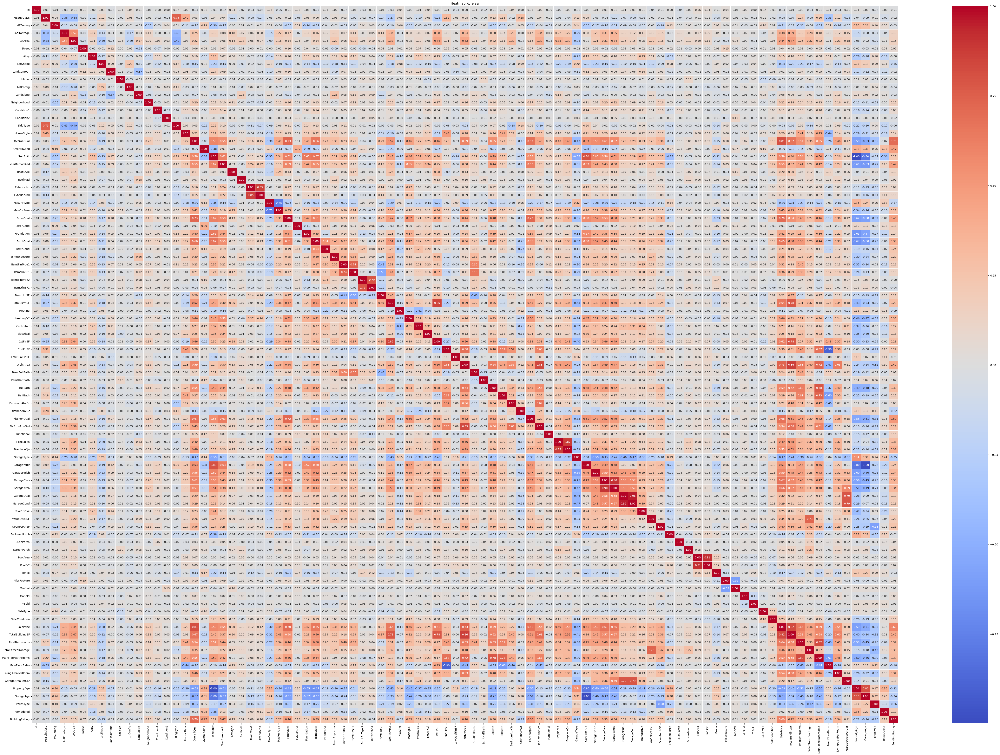

In [95]:
plt.figure(figsize=(72, 48))
sns.heatmap(sales_correlation, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Heatmap Korelasi')
plt.show()

Fitur Selecting perlu dilakukan untuk mencari fitur-fitur yang sesuai dengan target column. Hal ini dilakukan agar tidak terjadi bias pada model yang akan dibangun. Selain itu juga untuk mengurangi dimensi data yang tidak terlalu berpengaruh pada model sehingga komputasi yang dilakukan lebih cepat.

### **Feature Importance**

In [96]:
positive_correlations = sales_correlation[(sales_correlation['SalePrice'] > 0.3) & (sales_correlation['SalePrice'] < 1)]
negative_correlations = sales_correlation[sales_correlation['SalePrice'] < -0.3]

positive_relevant_columns = positive_correlations.index
positive_correlation_values = positive_correlations['SalePrice']

negative_relevant_columns = negative_correlations.index
negative_correlation_values = negative_correlations['SalePrice']


In [97]:
print("Korelasi Positif:")
for column, correlation_value in zip(positive_relevant_columns, positive_correlation_values):
    print(f"Fitur: {column}, Correlation with SalePrice: {correlation_value}")

Korelasi Positif:
Fitur: LotFrontage, Correlation with SalePrice: 0.3761462111437718
Fitur: LotArea, Correlation with SalePrice: 0.43655559628357055
Fitur: OverallQual, Correlation with SalePrice: 0.812369458889186
Fitur: YearBuilt, Correlation with SalePrice: 0.5854580739948182
Fitur: YearRemodAdd, Correlation with SalePrice: 0.5520260204272455
Fitur: MasVnrArea, Correlation with SalePrice: 0.4495972992574466
Fitur: ExterQual, Correlation with SalePrice: 0.7003659630588421
Fitur: Foundation, Correlation with SalePrice: 0.4156237364602366
Fitur: BsmtQual, Correlation with SalePrice: 0.6496504228191562
Fitur: BsmtExposure, Correlation with SalePrice: 0.364509986431366
Fitur: BsmtFinType1, Correlation with SalePrice: 0.31871303519145205
Fitur: BsmtFinSF1, Correlation with SalePrice: 0.3646052249791405
Fitur: TotalBsmtSF, Correlation with SalePrice: 0.6441123191676862
Fitur: HeatingQC, Correlation with SalePrice: 0.45890312546577916
Fitur: 1stFlrSF, Correlation with SalePrice: 0.612267475

Fitur yang memiliki minimal 0.3 kooefisien korelasi akan dipilih sebagai fitur yang akan digunakan dalam model. Fitur `TotalBuildingSF` memiliki `korelasi` yang paling tinggi dengan fitur `SalePrice`. Hal ini menunjukkan bahwa `TotalBuildingSF` memiliki hubungan yang kuat dengan harga penjualan rumah. Semakin tinggi nilai fitur `TotalBuildingSF` maka harga jual rumah semakin tinggi juga begiru pula sebaliknya. 

Sedangkan fitur `BsmntFinType1` memiliki korelasi yang paling rendah dengan fitur `SalePrice`. Hal ini menunjukan bahwa fitur `BsmntFinType1` memiliki hubungan yang lemah dengan harga penjualan rumah. Jadi tinggi rendahnya nilai fitur `BsmntFinType1` kurang mempengaruhi harga jual rumah.

In [98]:
print("\nKorelasi Negatif:")
for column, correlation_value in zip(negative_relevant_columns, negative_correlation_values):
    print(f"Fitur: {column}, Correlation with SalePrice: {correlation_value}")


Korelasi Negatif:
Fitur: MasVnrType, Correlation with SalePrice: -0.30371242919311525
Fitur: GarageType, Correlation with SalePrice: -0.467747197553237
Fitur: PropertyAge, Correlation with SalePrice: -0.5858079486182214
Fitur: GarageAge, Correlation with SalePrice: -0.5129492526891238
Fitur: PorchType, Correlation with SalePrice: -0.33255523482120086


In [99]:
featuresX = positive_relevant_columns.to_list()

Dalam kasus dataset `Housing Prices Competition`, kita hanya menggunakan fitur yang berkorelasi positif dengan fitur `SalePrice`. 

Keputusan ini dapat membantu model untuk fokus pada fitur independen yang memiliki pola yang lebih signifikan dengan fitur `SalePrice`. 
Selain itu, fitur independen dengan korelasi positif memberikan informasi yang konsisten dan sejalan dengan fitur `SalePrice` sehingga pembelajaran model akan lebih efektif. Mengurangi kompleksitas model dengan memilih fitur independen dengan korelasi positif juga dapat membantu mengurangi overfitting dan meningkatkan pemahaman model.

## **Splitting Data**

### **Split Data to X and y**

In [100]:
df_encoded = pd.DataFrame(data_encoded)

y = df_encoded[target_columns]
X = df_encoded[featuresX]

In [101]:
y

,SalePrice
0,208500
1,181500
2,223500
3,140000
4,250000
...,...
1455,175000
1456,210000
1457,266500
1458,142125


In [102]:
X

,LotFrontage,LotArea,OverallQual,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,...,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,TotalBuildingSF,TotalBathrooms,TotalStreetFrontage,MainFloorBathrooms,LivingAreaPerRoom,BuildingRating
0,65.0,8450,7,2003,2003,196.0,2,2,3,1,...,2,548,0,61,2566,4,126.0,3,213.750000,6
1,80.0,9600,6,1976,1976,0.0,1,1,3,4,...,2,460,298,0,2524,3,378.0,2,210.333333,7
2,68.0,11250,7,2001,2002,162.0,2,2,3,2,...,2,608,0,42,2706,4,110.0,3,297.666667,6
3,60.0,9550,7,1916,1970,0.0,1,0,2,1,...,3,642,0,35,2473,2,367.0,1,245.285714,6
4,84.0,14260,8,2000,2000,350.0,2,2,3,3,...,3,836,192,84,3343,4,360.0,3,244.222222,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,62.0,7917,6,1999,2000,0.0,1,2,3,1,...,2,460,0,40,2600,3,102.0,3,235.285714,6
1456,85.0,13175,6,1978,1988,119.0,1,1,3,1,...,2,500,335,0,3373,3,420.0,2,296.142857,6
1457,66.0,9042,7,1941,2006,0.0,3,4,2,1,...,1,252,0,60,3481,2,126.0,2,260.000000,7
1458,68.0,9717,5,1950,1996,0.0,1,1,2,2,...,1,240,335,0,2156,2,489.0,1,215.600000,6


### **Split Data to Train and Test 80:20**

In [103]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [104]:
X_train

,LotFrontage,LotArea,OverallQual,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,...,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,TotalBuildingSF,TotalBathrooms,TotalStreetFrontage,MainFloorBathrooms,LivingAreaPerRoom,BuildingRating
254,70.0,8400,5,1957,1957,0.0,1,1,2,1,...,1,294,250,0,2628,2,320.0,1,262.800000,6
1066,59.0,7837,6,1993,1994,0.0,2,2,3,1,...,2,380,0,40,2370,3,99.0,3,224.428571,7
638,67.0,8777,5,1916,1950,0.0,1,1,1,1,...,0,0,328,0,1592,1,489.0,1,212.000000,6
799,60.0,7200,5,1937,1950,252.0,1,0,3,1,...,1,240,0,0,2499,3,324.0,2,252.571429,6
380,50.0,5000,5,1924,1950,0.0,1,0,2,1,...,1,308,0,0,2717,2,292.0,2,281.833333,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1095,78.0,9317,6,2006,2006,0.0,2,2,3,1,...,2,440,0,22,2628,2,100.0,2,219.000000,6
1130,65.0,7804,4,1928,1950,0.0,1,0,2,1,...,2,576,335,44,3103,3,444.0,2,283.000000,5
1294,60.0,8172,5,1955,1990,0.0,1,1,2,1,...,2,572,0,0,1728,2,60.0,1,172.800000,6
860,55.0,7642,7,1918,1998,0.0,2,0,2,1,...,1,216,0,175,2338,2,230.0,2,203.714286,7


Dataset dilakukan splitting data dengan rasio 80:20. Hal ini dilakukan agar model yang dibangun dapat diuji dengan data yang belum pernah dilihat sebelumnya. Dengan demikian, kita dapat mengevaluasi seberapa baik model kita dalam memprediksi harga penjualan rumah pada data baru.


## **Feature Scaling**

In [105]:
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.fit_transform(X_test)

In [106]:
np.set_printoptions(suppress=True)
print(X_train[:10])

[[ 0.04579538 -0.39152852 -0.82044456 -0.49906088 -1.34606303 -0.66598819
  -0.68742066 -0.55389881 -0.66026715 -0.58772739 -0.25578675  1.18947632
   0.73390423 -1.16829211  0.46387128 -0.43641837 -1.05556573 -0.76707624
  -1.02331676 -0.9684222  -1.0162412  -0.96591683  0.3096338  -1.06342123
  -0.88787157  1.44340001 -0.8279811   0.13168665 -0.4816716   0.59586861
  -1.21792095  0.90601768 -0.13823987]
 [-0.61903976 -0.55442209 -0.08893368  0.73488666  0.43921379 -0.66598819
   1.05424384  0.81967616  0.62078274 -0.58772739 -1.20876576 -1.05361949
  -0.74921075 -0.1321758  -1.08005628  0.13674795  0.7736639  -0.76707624
   0.3039836   0.60694985  0.63922564  0.60592693  0.3096338   0.30299901
  -0.45851992 -0.80648283 -0.09331181 -0.29197809  0.65948951 -1.07213959
   1.32231417 -0.12990568  1.29064662]
 [-0.13552329 -0.28245059 -0.82044456 -1.90439002 -1.6838181  -0.66598819
  -0.68742066 -0.55389881 -1.94131704 -0.58772739 -1.20876576 -1.05361949
  -0.75785025 -0.1321758  -1.08905

Scaling dilakukan untuk mengubah nilai-nilai fitur numerik dalam skala yang sama. Hal ini dilakukan agar model yang dibangun dapat belajar dengan baik dari data yang diberikan. Scaling juga dapat membantu meningkatkan konvergensi model dan mempercepat proses pembelajaran.

## **Model Development and Evaluation**

Untuk mengevaluasi kinerja model prediksi harga rumah, metrik `R2 Score`, `Mean Absolute Error (MAE)`, dan `Mean Absolute Percentage Error (MAPE)` sangat relevan untuk digunkaan dalam evaluasi model. `R2 Score` memberikan gambaran tentang seberapa baik model dapat menjelaskan variasi harga rumah dalam dataset, sementara `MAE` dan `MAPE` memberikan informasi tentang akurasi prediksi secara keseluruhan dan relatif terhadap skala harga rumah. Kombinasi dari ketiga metrik ini memungkinkan pemahaman yang komprehensif tentang kinerja model dalam memprediksi harga rumah, yang penting untuk pengambilan keputusan yang tepat dalam industri real estate dan keuangan.

### **Model Selection**

In [107]:
linear_model = LinearRegression()
ridge_model = Ridge(alpha=1.0)
lasso_model = Lasso(alpha=1.0)
elastic_model = ElasticNet(alpha=1.0, l1_ratio=0.5)
huber_model = HuberRegressor()
rf_model = RandomForestRegressor(max_depth=2, random_state=0)
xgb_model = xgb.XGBRegressor()
ada_model = AdaBoostRegressor()
svr_model = SVR(kernel='linear')
dt_model = DecisionTreeRegressor()

1. **Linear Regression (`linear_model`)**:
   - Model ini dipilih karena kemudahannya dalam interpretasi dan implementasi. Jika hubungan antara fitur dan harga rumah secara linear dapat diasumsikan, model ini dapat memberikan hasil yang baik.

2. **Ridge Regression (`ridge_model`)**:
   - Ridge Regression dipilih karena kemampuannya menangani masalah multikolinearitas dalam data. Ini dapat membantu memperbaiki performa model saat ada fitur-fitur yang berkorelasi kuat.

3. **Lasso Regression (`lasso_model`)**:
   - Lasso Regression dipilih karena kemampuannya dalam seleksi fitur, yang dapat membantu mengurangi dimensi fitur jika diperlukan.

4. **ElasticNet Regression (`elastic_model`)**:
   - Model ini dipilih karena merupakan kombinasi dari L1 (Lasso) dan L2 (Ridge) regularization, sehingga dapat memberikan kontrol yang baik terhadap trade-off antara kedua regularisasi tersebut.

5. **Huber Regressor (`huber_model`)**:
   - Huber Regressor dipilih karena kelebihannya dalam menangani pencilan atau nilai ekstrim dalam data. Ini bisa bermanfaat karena dalam prediksi harga rumah, ada kemungkinan terdapat outlier yang memengaruhi model.

6. **Random Forest Regressor (`rf_model`)**:
   - Model ini dipilih karena kemampuannya menangani nonlinearitas dan interaksi antara fitur. Juga, Random Forest cenderung lebih tahan terhadap overfitting, yang bermanfaat ketika data memiliki banyak fitur.

7. **XGBoost Regressor (`xgb_model`)**:
   - XGBoost dipilih karena performa yang sangat baik dan kemampuannya menangani berbagai jenis data dengan baik.

8. **AdaBoost Regressor (`ada_model`)**:
   - AdaBoost dipilih karena kemampuannya menghasilkan model ensemble yang adaptif, yang dapat berguna dalam menangani data dengan noise atau data yang sulit dipisahkan.

9. **Support Vector Regressor (`svr_model`)**:
   - SVR dipilih karena kemampuannya menangani data dengan dimensi tinggi dan relatif sedikit sampel, serta mampu menangani non-linearitas melalui penggunaan fungsi kernel.

10. **Decision Tree Regressor (`dt_model`)**:
    - Decision Tree dipilih karena sifatnya yang mudah diinterpretasi dan visualisasi, serta kemampuannya dalam menangani hubungan non-linear antara fitur dan target.

### **Validation with Splitting Data**

In [108]:
def evaluate_model(y_train, y_pred_train, y_test, y_pred_test, model_name):
    r2score_train = r2_score(y_train, y_pred_train)
    mae_train = mean_absolute_error(y_train, y_pred_train)
    mape_train = mean_absolute_percentage_error(y_train, y_pred_train)*100

    r2score_test = r2_score(y_test, y_pred_test)
    mae_test = mean_absolute_error(y_test, y_pred_test)
    mape_test = mean_absolute_percentage_error(y_test, y_pred_test)*100
    
    dataTrain = {
        'Model': [model_name],
        'R2 Score (Train)': ['{:.5f}'.format(r2score_train)],
        'Mean Absolute Error (Train)': ['{:.5f}'.format(mae_train)],
        'Mean Absolute Percentage Error (Train)': ['{:.5f}'.format(mape_train)],
    }

    dataTest = {
        'Model': [model_name],
        'R2 Score (Test)': ['{:.5f}'.format(r2score_test)],
        'Mean Absolute Error (Test)': ['{:.5f}'.format(mae_test)],
        'Mean Absolute Percentage Error (Test)': ['{:.5f}'.format(mape_test)]
    }
    
    df_Tr = pd.DataFrame(dataTrain)
    df_Ts = pd.DataFrame(dataTest)
    return df_Tr, df_Ts

#### **Linear Regression**

In [109]:
linear_model.fit(X_train, y_train)

LinearRegression()

In [110]:
y_pred_linearTr = linear_model.predict(X_train)
y_pred_linear = linear_model.predict(X_test)
dfLr_tr, dfLr_ts = evaluate_model(y_train, y_pred_linearTr, y_test, y_pred_linear, model_name='Linear')

In [111]:
dfLr_tr

,Model,R2 Score (Train),Mean Absolute Error (Train),Mean Absolute Percentage Error (Train)
0,Linear,0.88110,15863.69588,9.76289


In [112]:
dfLr_ts

,Model,R2 Score (Test),Mean Absolute Error (Test),Mean Absolute Percentage Error (Test)
0,Linear,0.90194,15901.52478,9.89641


Dapat dilihat bahwa model `Linear` memiliki nilai `R2 Score` sebesar `0.881` pada data training dan `0.901` pada data testing. Hal ini menunjukkan bahwa model `Linear` mampu menjelaskan `88%` variansi dari data training dan `90%` variansi dari data testing. Ini menunjukkan bahwa model mampu menggeneralisasi dengan baik terhadap data yang belum pernah dilihat sebelumnya dan tidak mengalami overfitting atau underfitting. meskipun terjadi peningkatan dalam `R2 Score` dari data training ke data uji, `MAE` dan `MAPE` juga meningkat sedikit. Ini menunjukkan bahwa meskipun model mungkin memiliki kemampuan yang baik dalam menjelaskan variasi dalam data, tetapi masih ada ruang untuk memperbaiki tingkat akurasi atau presisi prediksinya, terutama dalam hal mengurangi kesalahan absolut atau persentase dari prediksi model.

#### **Ridge Regression**

In [113]:
ridge_model.fit(X_train, y_train)

Ridge()

In [114]:
y_pred_ridgeTr = ridge_model.predict(X_train)
y_pred_ridge = ridge_model.predict(X_test)
dfRg_tr,dfRg_ts = evaluate_model(y_train, y_pred_ridgeTr, y_test, y_pred_ridge, model_name='Ridge')

In [115]:
dfRg_tr

,Model,R2 Score (Train),Mean Absolute Error (Train),Mean Absolute Percentage Error (Train)
0,Ridge,0.88107,15868.59050,9.76518


In [116]:
dfRg_ts

,Model,R2 Score (Test),Mean Absolute Error (Test),Mean Absolute Percentage Error (Test)
0,Ridge,0.90175,15934.62979,9.91681


Pada model `Ridge` hasil evaluasi menunjukan `R2 Score` sekitar `0.88` pada data training dan sekitar `0.90` pada data testing. Hal ini berarti bahwa model `Ridge` mampu menjelaskan `88%` variansi dari data training dan `90%` variansi dari data testing, menunjukkan kinerja yang serupa dengan model `Linear` yang sebelumnya dibahas. Meskipun, ada sedikit peningkatan dalam nilai `MAE` dan `MAPE` dari kedua data tetapi jumlahnya tidak terlalu signifikan.

#### **Lasso Regression**

In [117]:
lasso_model.fit(X_train, y_train)

Lasso()

In [118]:
y_pred_lassoTr = lasso_model.predict(X_train)
y_pred_lasso = lasso_model.predict(X_test)
dfLs_tr,dfLs_ts = evaluate_model(y_train, y_pred_lassoTr, y_test, y_pred_lasso, model_name='Lasso')

In [119]:
dfLs_tr

,Model,R2 Score (Train),Mean Absolute Error (Train),Mean Absolute Percentage Error (Train)
0,Lasso,0.88110,15863.69447,9.76284


In [120]:
dfLs_ts

,Model,R2 Score (Test),Mean Absolute Error (Test),Mean Absolute Percentage Error (Test)
0,Lasso,0.90194,15902.49424,9.89687


Evaluasi model `Lasso` `R2 Score` sekitar `0.88` pada data training dan sekitar `0.90` pada data testing. Hal ini menunjukkan bahwa model `Lasso` mampu menjelaskan `88%` variansi dari data training dan `90%` variansi dari data testing, menunjukkan kinerja yang serupa dengan model `Linear` dan `Ridge` yang sebelumnya dibahas. Meskipun, ada sedikit peningkatan dalam nilai `MAE` dan `MAPE` dari kedua data tetapi jumlahnya tidak terlalu signifikan.

#### **Elastic Net Regression**

In [121]:
elastic_model.fit(X_train, y_train)

ElasticNet()

In [122]:
y_pred_elasticTr = elastic_model.predict(X_train)
y_pred_elastic = elastic_model.predict(X_test)
dfEn_tr, dfEn_ts = evaluate_model(y_train, y_pred_elasticTr, y_test, y_pred_elastic, model_name='Elastic Net')

In [123]:
dfEn_tr

,Model,R2 Score (Train),Mean Absolute Error (Train),Mean Absolute Percentage Error (Train)
0,Elastic Net,0.87082,16569.77225,9.87360


In [124]:
dfEn_ts

,Model,R2 Score (Test),Mean Absolute Error (Test),Mean Absolute Percentage Error (Test)
0,Elastic Net,0.89606,16758.58915,10.32323


Model `Elastic Net` mencapai `R2 Score` sekitar `0.87` pada data training dan sekitar `0.896` pada data training. Ini menunjukkan bahwa model mampu menjelaskan sekitar `87%` dan `89.6%` variasi dalam data training dan training secara berturut-turut. Selain itu, terjadi sedikit kenaikan pada `MAE` dan `MAPE` pada data training dibandingkan dengan data training. Meskipun peningkatan tersebut ada, keduanya tetap dalam kisaran yang dapat diterima. Baik `R2 Score` dan kedua `Erorr Metriks` menunjukkan bahwa meskipun ada sedikit perbedaan dalam kinerja model antara data training dan training, model masih secara keseluruhan mampu melakukan generalisasi dengan baik pada data baru.

#### **Huber Regression**

In [125]:
huber_model.fit(X_train, y_train)

HuberRegressor()

In [126]:
y_pred_huberTr = huber_model.predict(X_train)
y_pred_huber = huber_model.predict(X_test)
dfHb_tr,dfHb_ts = evaluate_model(y_train, y_pred_huberTr, y_test, y_pred_huber, model_name='Huber')

In [127]:
dfHb_tr

,Model,R2 Score (Train),Mean Absolute Error (Train),Mean Absolute Percentage Error (Train)
0,Huber,0.87885,15632.95419,9.54606


In [128]:
dfHb_ts

,Model,R2 Score (Test),Mean Absolute Error (Test),Mean Absolute Percentage Error (Test)
0,Huber,0.90258,15678.88373,9.73677


Dapat dilihat pada model `Huber` memiliki `R2 Score` sebesar `0.878`, yang menunjukkan bahwa sekitar `87.9%` variansi dari data training dapat dijelaskan oleh model. Pada data testing, `R2 Score` meningkat menjadi `0.9025`, yang berarti sekitar `90.3%` variansi dari data testing dapat dijelaskan oleh model. Ini menunjukkan bahwa model mampu menggeneralisasi dengan baik terhadap data yang belum pernah dilihat sebelumnya dan tidak mengalami overfitting atau underfitting. Meskipun terdapat sedikit kenaikan pada `MAE`, dan `MAPE` pada data testing dibandingkan dengan data training perbedaan tersebut tetap dalam kisaran yang dapat diterima. Hal ini menunjukkan bahwa model `Huber` mampu melakukan generalisasi dengan baik pada data baru, dengan tingkat kesalahan yang relatif rendah dan kemampuan yang baik dalam menjelaskan variasi dalam data.

#### **Random Forest Regressor**

In [129]:
rf_model.fit(X_train, y_train)

RandomForestRegressor(max_depth=2, random_state=0)

In [130]:
y_pred_rfTr = rf_model.predict(X_train)
y_pred_rf = rf_model.predict(X_test)
dfRf_tr,dfRf_ts = evaluate_model(y_train, y_pred_rfTr, y_test, y_pred_rf, model_name='Random Forest')

In [131]:
dfRf_tr

,Model,R2 Score (Train),Mean Absolute Error (Train),Mean Absolute Percentage Error (Train)
0,Random Forest,0.77713,23649.17301,14.69106


In [132]:
dfRf_ts

,Model,R2 Score (Test),Mean Absolute Error (Test),Mean Absolute Percentage Error (Test)
0,Random Forest,0.82421,22338.98333,14.65992


`R2 Score` meningkat dari sekitar `0.78` pada data training menjadi sekitar `0.82` pada data testing. Hal ini menunjukkan bahwa model mampu menjelaskan variasi yang lebih besar dalam data testing, yang merupakan indikasi positif dari kemampuan generalisasi model. Peningkatan pada `R2 Score` diikuti penurunan pada `MAE` dan `MAPE` dari data training ke data testing, menunjukkan bahwa model mampu memprediksi dengan lebih akurat dan memiliki kesalahan yang lebih rendah pada data testing, yang merupakan hasil yang diinginkan. Secara keseluruhan, model `Random Forest` menunjukkan peningkatan kinerja yang baik dari data training ke data testing, yang menunjukkan bahwa model ini mampu melakukan generalisasi dengan baik dan memprediksi dengan lebih akurat pada data baru.

#### **Extreme Gradient Boosting Regressor**

In [133]:
xgb_model.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [134]:
y_pred_xgbTr = xgb_model.predict(X_train)
y_pred_xgb = xgb_model.predict(X_test)
dfXb_tr, dfXb_ts = evaluate_model(y_train, y_pred_xgbTr, y_test, y_pred_xgb, model_name='XGBoost')

In [135]:
dfXb_tr

,Model,R2 Score (Train),Mean Absolute Error (Train),Mean Absolute Percentage Error (Train)
0,XGBoost,0.99989,348.79407,0.22281


In [136]:
dfXb_ts

,Model,R2 Score (Test),Mean Absolute Error (Test),Mean Absolute Percentage Error (Test)
0,XGBoost,0.88337,15558.51343,8.78104


Dapat kita liht jika `R2 Score` sangat tinggi pada data training, mencapai sekitar `0.99989`, yang menunjukkan bahwa model `XGBoost` hampir sempurna dalam menjelaskan variasi dalam data training. Namun, kinerja pada data testing menunjukkan `R2 Score` sekitar `0.88`, yang masih tinggi tetapi jauh lebih rendah dari data training. Hal ini menunjukkan adanya overfitting, di mana model terlalu cocok dengan data training dan kesulitan dalam melakukan generalisasi pada data baru. `MAE` dan `MAPE` pada data testing juga cukup tinggi, menunjukkan bahwa model `XGBoost` memiliki tingkat kesalahan yang signifikan dalam memprediksi data testing. Dalam kasus ini, perlu dilakukan penyesuaian model, seperti pemilihan parameter yang lebih baik atau penerapan teknik regularisasi, untuk mengurangi overfitting dan meningkatkan generalisasi model pada data testing.

#### **Adaptive Boosting Regressor**

In [137]:
ada_model.fit(X_train, y_train)

AdaBoostRegressor()

In [138]:
y_pred_adaTr = ada_model.predict(X_train)
y_pred_ada = ada_model.predict(X_test)
dfAb_tr, dfAb_ts = evaluate_model(y_train, y_pred_adaTr, y_test, y_pred_ada, model_name='AdaBoost')

In [139]:
dfAb_tr

,Model,R2 Score (Train),Mean Absolute Error (Train),Mean Absolute Percentage Error (Train)
0,AdaBoost,0.87667,18274.74268,11.25507


In [140]:
dfAb_ts

,Model,R2 Score (Test),Mean Absolute Error (Test),Mean Absolute Percentage Error (Test)
0,AdaBoost,0.86493,19173.69205,12.22296


`R2 Score` pada data training adalah sekitar `0.87`, sedangkan pada data testing adalah sekitar `0.86`. Meskipun terjadi penurunan, keduanya masih cukup tinggi, menunjukkan bahwa model mampu menjelaskan variasi dalam data baik pada data training maupun pada data testing. `MAE` dan `MAPE` pada data testing juga sedikit lebih tinggi dibandingkan dengan data training, menunjukkan bahwa model `AdaBoost` memiliki tingkat kesalahan yang lebih tinggi dalam memprediksi data testing. Secara keseluruhan, meskipun terjadi sedikit penurunan dalam kinerja model dari data training ke data testing, model `AdaBoost` masih menunjukkan kinerja yang baik dalam melakukan generalisasi pada data baru.

#### **Support Vector Regressor**

In [141]:
svr_model.fit(X_train, y_train)

SVR(kernel='linear')

In [142]:
y_pred_svrTr = svr_model.predict(X_train)
y_pred_svr = svr_model.predict(X_test)
dfSv_tr, dfSv_ts = evaluate_model(y_train, y_pred_svrTr, y_test, y_pred_svr, model_name='SVR')

In [143]:
dfSv_tr

,Model,R2 Score (Train),Mean Absolute Error (Train),Mean Absolute Percentage Error (Train)
0,SVR,0.24558,41603.34083,23.54039


In [144]:
dfSv_ts

,Model,R2 Score (Test),Mean Absolute Error (Test),Mean Absolute Percentage Error (Test)
0,SVR,0.27195,43688.91770,25.69148


Pada model Support Vector Regression (SVR), terdapat kinerja yang rendah baik pada data training maupun pada data testing. `R2 Score` pada data training adalah sekitar `0.25`, sedangkan pada data testing adalah sekitar `0.27`. Ini menunjukkan bahwa model SVR memiliki kemampuan yang sangat terbatas dalam menjelaskan variasi dalam data, baik pada data training maupun pada data testing. `MAE` dan `MAPE` pada data testing juga sangat tinggi, menunjukkan bahwa model SVR memiliki tingkat kesalahan yang besar dalam memprediksi data training maupun testing.

#### **Decision Tree Regressor**

In [145]:
dt_model.fit(X_train, y_train)

DecisionTreeRegressor()

In [146]:
y_pred_dtTr = dt_model.predict(X_train)
y_pred_dt = dt_model.predict(X_test)
dfDt_tr, dfDt_ts = evaluate_model(y_train, y_pred_dtTr, y_test, y_pred_dt, model_name='Decision Tree')

In [147]:
dfDt_tr

,Model,R2 Score (Train),Mean Absolute Error (Train),Mean Absolute Percentage Error (Train)
0,Decision Tree,1.00000,0.00000,0.00000


In [148]:
dfDt_ts

,Model,R2 Score (Test),Mean Absolute Error (Test),Mean Absolute Percentage Error (Test)
0,Decision Tree,0.76210,22419.18836,13.54411



Pada model `Decision Tree`, terdapat perbedaan signifikan dalam kinerja dari data pelatihan ke data pengujian. `R2 Score` pada data pelatihan adalah sempurna `1.0`, sedangkan pada data pengujian adalah sekitar `0.80`. Ini menunjukkan adanya overfitting yang cukup serius, di mana model terlalu cocok dengan data pelatihan dan kesulitan dalam melakukan generalisasi pada data baru.Meskipun `R2 Score` pada data pengujian masih cukup tinggi, terdapat peningkatan yang signifikan pada `MAE` dan `MAPE` dari data training ke data testing. Ini menunjukkan bahwa model Decision Tree memiliki tingkat kesalahan yang tinggi dalam memprediksi data testing. `Decision Tree` menunjukkan kinerja yang sangat baik pada data training tetapi gagal melakukan generalisasi dengan baik pada data testing. Hal ini menandakan perlunya melakukan penyetelan parameter atau penerapan teknik regularisasi untuk mengurangi overfitting dan meningkatkan kinerja model pada data baru.

### **Cross Validation**

In [149]:
def custom_r2_scorer(estimator, X, y):
    y_pred = estimator.predict(X)
    return r2_score(y, y_pred)

def custom_mae_scorer(estimator, X, y):
    y_pred = estimator.predict(X)
    return mean_absolute_error(y, y_pred)

def custom_mape_scorer(estimator, X, y):
    y_pred = estimator.predict(X)
    mape = mean_absolute_percentage_error(y, y_pred) * 100
    return mape

In [150]:
def cross_validation(estimator, X, y, cv, model_name):
    scoring = {'r2': custom_r2_scorer,'mae': custom_mae_scorer, 'mape': custom_mape_scorer}
    train_results = cross_validate(estimator, X, y, cv=cv, scoring=scoring, return_train_score=True)
    test_results = cross_validate(estimator, X, y, cv=cv, scoring=scoring)

    train_scores = train_results
    test_scores = test_results
    
    train_r2_mean = np.mean(train_scores['train_r2'])
    train_mae_mean = np.mean(train_scores['train_mae'])
    train_mape_mean = np.mean(train_scores['train_mape'])

    test_r2_mean = np.mean(test_scores['test_r2'])
    test_mae_mean = np.mean(test_scores['test_mae'])
    test_mape_mean = np.mean(test_scores['test_mape'])
    
    dataTraincv = {
        'Model': [model_name],
        'R2 Score (Train)': ['{:.5f}'.format(train_r2_mean)],
        'Mean Absolute Error (Train)': ['{:.5f}'.format(train_mae_mean)],
        'Mean Absolute Percentage Error (Train)': ['{:.5f}'.format(train_mape_mean)],
    }

    dataTestcv = {
        'Model': [model_name],
        'R2 Score (Test)': ['{:.5f}'.format(test_r2_mean)],
        'Mean Absolute Error (Test)': ['{:.5f}'.format(test_mae_mean)],
        'Mean Absolute Percentage Error (Test)': ['{:.5f}'.format(test_mape_mean)]
    }
    
    df_Trcv = pd.DataFrame(dataTraincv)
    df_Tscv = pd.DataFrame(dataTestcv)
    return df_Trcv, df_Tscv

In [151]:
kfold = KFold(n_splits=10, shuffle=True, random_state=42)

#### **Linear Regression**

In [152]:
dfLr_trcv,dfLr_tscv = cross_validation(linear_model, X, y, kfold, model_name='Linear')

In [153]:
dfLr_trcv

,Model,R2 Score (Train),Mean Absolute Error (Train),Mean Absolute Percentage Error (Train)
0,Linear,0.88723,15726.66240,9.68018


In [154]:
dfLr_tscv

,Model,R2 Score (Test),Mean Absolute Error (Test),Mean Absolute Percentage Error (Test)
0,Linear,0.87673,16224.33051,9.98510


Model `Linear` menunjukkan kinerja yang solid dalam pemodelan, dengan `R2 Score` sekitar `0.887` pada data training dan sekitar `0.876` pada data testing. Meskipun terdapat sedikit penurunan pada data testing, keduanya masih menunjukkan kemampuan yang baik dalam menjelaskan variasi dalam data. Namun, terdapat sedikit peningkatan dalam `MAE` dan `MAPE` pada data testing, menunjukkan adanya sedikit peningkatan kesalahan prediksi pada data baru. Meskipun demikian, hasil ini menunjukkan bahwa model `Linear` mampu melakukan generalisasi yang baik dari data training ke data testing, yang merupakan indikasi positif tentang kemampuan model untuk menghasilkan prediksi yang konsisten dan dapat diandalkan pada data baru.

#### **Ridge Regression**

In [155]:
dfRg_trcv, dfRg_tscv = cross_validation(ridge_model, X, y, kfold, model_name='Ridge')

In [156]:
dfRg_trcv

,Model,R2 Score (Train),Mean Absolute Error (Train),Mean Absolute Percentage Error (Train)
0,Ridge,0.88723,15725.57487,9.67945


In [157]:
dfRg_tscv

,Model,R2 Score (Test),Mean Absolute Error (Test),Mean Absolute Percentage Error (Test)
0,Ridge,0.87675,16222.29373,9.98398


Model `Ridge` menunjukkan kinerja yang konsisten antara data training dan data testing. `R2 Score` pada data training sekitar `0.887`, sedangkan pada data testing sekitar `0.876`. Meskipun terdapat sedikit penurunan pada data testing, keduanya tetap menunjukkan kemampuan yang baik dalam menjelaskan variasi dalam data. Terdapat sedikit peningkatan dalam `MAE` dan `MAPE` pada data testing, namun perbedaannya tidak signifikan. Hal ini menunjukkan bahwa model `Ridge` mampu melakukan generalisasi dengan baik dari data training ke data testing, menunjukkan konsistensi dan keandalan prediksi model pada data baru.

#### **Lasso Regression**

In [158]:
dfLs_trcv, dfLs_tscv = cross_validation(lasso_model, X, y, kfold, model_name='Lasso')

In [159]:
dfLs_trcv

,Model,R2 Score (Train),Mean Absolute Error (Train),Mean Absolute Percentage Error (Train)
0,Lasso,0.88723,15726.23607,9.67986


In [160]:
dfLs_tscv

,Model,R2 Score (Test),Mean Absolute Error (Test),Mean Absolute Percentage Error (Test)
0,Lasso,0.87674,16223.60412,9.98462


Model `Lasso` menunjukkan konsistensi yang serupa antara data training dan data testing. `R2 Score` pada data training sekitar `0.887`, sementara pada data testing sekitar `0.876`. Meskipun terdapat sedikit penurunan pada data testing, keduanya masih menunjukkan kemampuan yang baik dalam menjelaskan variasi dalam data. Terdapat sedikit peningkatan dalam `MAE` dan `MAPE` pada data testing, namun perbedaannya tidak signifikan. Hal ini menunjukkan bahwa model `Lasso` juga mampu melakukan generalisasi yang baik dari data training ke data testing, menunjukkan konsistensi dan keandalan prediksi model pada data baru.

#### **Elastic Net Regression**

In [161]:
dfEn_trcv, dfEn_tscv = cross_validation(elastic_model, X, y, kfold, model_name='Elastic Net')

In [162]:
dfEn_trcv

,Model,R2 Score (Train),Mean Absolute Error (Train),Mean Absolute Percentage Error (Train)
0,Elastic Net,0.87686,16193.32469,9.87466


In [163]:
dfEn_tscv

,Model,R2 Score (Test),Mean Absolute Error (Test),Mean Absolute Percentage Error (Test)
0,Elastic Net,0.86882,16521.89406,10.07689


Model `Elastic Net` menunjukkan kinerja yang konsisten antara data training dan data testing. `R2 Score` pada data training adalah sekitar `0.876`, sedangkan pada data testing adalah sekitar `0.868`. Meskipun terdapat sedikit penurunan pada data testing, keduanya masih menunjukkan kemampuan yang baik dalam menjelaskan variasi dalam data. Terdapat sedikit peningkatan dalam `MAE` dan `MAPE` pada data testing, namun perbedaannya tidak signifikan. Hal ini menunjukkan bahwa model `Elastic Net` mampu melakukan generalisasi yang baik dari data training ke data testing, menunjukkan konsistensi dan keandalan prediksi model pada data baru.

#### **Huber Regression**

In [164]:
dfHb_trcv, dfHb_tscv = cross_validation(huber_model, X, y, kfold, model_name='Huber')

In [165]:
dfHb_trcv

,Model,R2 Score (Train),Mean Absolute Error (Train),Mean Absolute Percentage Error (Train)
0,Huber,0.76180,22797.58565,14.17084


In [166]:
dfHb_tscv

,Model,R2 Score (Test),Mean Absolute Error (Test),Mean Absolute Percentage Error (Test)
0,Huber,0.75274,23161.78059,14.39526


Model `Huber` menunjukkan kinerja yang kurang baik dalam pemodelan data. Meskipun kinerja antara data training dan data testing serupa, nilai `R2 Score` pada data training adalah sekitar `0.76`, sementara pada data testing adalah sekitar `0.75`. Nilai `R2 Score` yang rendah dan tingginya kesalahan absolut serta persentase menunjukkan bahwa model ini mungkin tidak mampu memodelkan data dengan baik. Hal ini menandakan bahwa model `Huber` mungkin tidak cocok untuk dataset yang diberikan, dan peningkatan performa mungkin dapat dicapai dengan menggunakan model yang lebih sesuai atau melakukan penyetelan parameter yang lebih baik. Dalam konteks ini, model `Huber` perlu dievaluasi lebih lanjut dan alternatif model perlu dipertimbangkan untuk meningkatkan kualitas prediksi.

#### **Random Forest Regressor**

In [167]:
dfRf_trcv,dfRf_tscv = cross_validation(rf_model, X, y, kfold, model_name='Random Forest')

In [168]:
dfRf_trcv

,Model,R2 Score (Train),Mean Absolute Error (Train),Mean Absolute Percentage Error (Train)
0,Random Forest,0.78118,23740.39986,14.70212


In [169]:
dfRf_tscv

,Model,R2 Score (Test),Mean Absolute Error (Test),Mean Absolute Percentage Error (Test)
0,Random Forest,0.76681,24355.47433,15.04478


Model `Random Forest` menunjukkan kinerja yang kurang baik dalam memodelkan data. `R2 Score` pada data training adalah sekitar `0.78`, sedangkan pada data testing adalah sekitar `0.766`.  Meskipun terdapat sedikit perbedaan antara kinerja data training dan data testing, baik R2 Score yang rendah maupun tingginya `MAE` dan `MAPE`, menunjukkan bahwa model ini mungkin kurang mampu secara efektif menjelaskan variabilitas dalam data. Hal ini menandakan bahwa Random Forest mungkin tidak cocok untuk dataset yang diberikan, dan mungkin diperlukan pendekatan model yang berbeda untuk meningkatkan kualitas prediksi. Dalam konteks ini, evaluasi lebih lanjut terhadap model `Random Forest` dan eksplorasi alternatif model mungkin diperlukan untuk mendapatkan hasil yang lebih baik.

#### **Extreme Gradient Boosting Regressor**

In [170]:
dfXb_trcv, dfXb_tscv = cross_validation(xgb_model, X, y, kfold, model_name='XGBoost')

In [171]:
dfXb_trcv

,Model,R2 Score (Train),Mean Absolute Error (Train),Mean Absolute Percentage Error (Train)
0,XGBoost,0.99985,506.86726,0.32458


In [172]:
dfXb_tscv

,Model,R2 Score (Test),Mean Absolute Error (Test),Mean Absolute Percentage Error (Test)
0,XGBoost,0.88759,15173.20040,9.03809


Model `XGBoost` menunjukkan kinerja yang sangat baik dalam memodelkan data. `R2 Score` pada data training sangat tinggi, sekitar `0.99985`, dan pada data testing juga cukup tinggi, sekitar `0.88759`. Hal ini menunjukkan bahwa model sangat baik dalam menjelaskan variasi dalam data. Meskipun terdapat perbedaan antara kinerja data training dan data testing, model tetap mampu memberikan prediksi yang konsisten. Namun, terdapat peningkatan yang signifikan dalam Mean Absolute Error (MAE) dan Mean Absolute Percentage Error (MAPE) pada data testing, yang menunjukkan adanya peningkatan kesalahan prediksi pada data baru. Selain itu ada kemungkinan model mengalami overfitting terhadap data training, hal ini dapat dilihat dari perbedaan antara `R2 Score` lebih dari sama dengan `0.1`. Dalam konteks ini, model `XGBoost` perlu dievaluasi lebih lanjut dan penyetelan parameter yang lebih baik mungkin diperlukan untuk meningkatkan kualitas prediksi. Meskipun demikian, performa yang tinggi pada R2 Score menandakan bahwa model XGBoost masih dapat diandalkan untuk melakukan prediksi dengan baik pada data baru.

#### **Adaptive Boosting Regressor**

In [173]:
dfAb_trcv, dfAb_tscv = cross_validation(ada_model, X, y, kfold, model_name='AdaBoost')

In [174]:
dfAb_trcv

,Model,R2 Score (Train),Mean Absolute Error (Train),Mean Absolute Percentage Error (Train)
0,AdaBoost,0.87408,18553.81112,11.57905


In [175]:
dfAb_tscv

,Model,R2 Score (Test),Mean Absolute Error (Test),Mean Absolute Percentage Error (Test)
0,AdaBoost,0.83614,20192.44255,12.44281


Model `AdaBoost` menunjukkan kinerja yang cukup baik dalam memodelkan data. `R2 Score` pada data training adalah sekitar `0.87`, sedangkan pada data testing adalah sekitar `0.839`. Meskipun terdapat perbedaan antara kinerja data training dan data testing, keduanya masih menunjukkan kemampuan yang baik dalam menjelaskan variasi dalam data. Namun, terdapat peningkatan yang signifikan dalam `MAE` dan `MAPE` pada data testing, yang menunjukkan adanya peningkatan kesalahan prediksi pada data baru. Meskipun demikian, model `AdaBoost` masih mampu melakukan generalisasi yang cukup baik dari data training ke data testing.

#### **Support Vector Regressor**

In [176]:
dfSv_trcv, dfSv_tscv = cross_validation(svr_model, X, y, kfold, model_name='SVR')

In [177]:
dfSv_trcv

,Model,R2 Score (Train),Mean Absolute Error (Train),Mean Absolute Percentage Error (Train)
0,SVR,0.82786,18696.85040,11.27341


In [178]:
dfSv_tscv

,Model,R2 Score (Test),Mean Absolute Error (Test),Mean Absolute Percentage Error (Test)
0,SVR,0.82202,19018.27509,11.47952


Model `SVR` menunjukkan kinerja yang baik dalam memodelkan data dengan `R2 Score` sekitar `0.827` pada data training dan sekitar `0.822` pada data testing. Hal ini menunjukkan bahwa model mampu menjelaskan sebagian besar variasi dalam data. Meskipun terdapat sedikit perbedaan antara kinerja data training dan data testing, keduanya masih menunjukkan kemampuan yang baik dalam menjelaskan data.Meskipun demikian, terdapat sedikit peningkatan dalam `MAE` dan `MAPE` pada data testing dibandingkan dengan data training, yang menunjukkan adanya sedikit peningkatan kesalahan prediksi pada data baru. Meskipun demikian, perbedaan tersebut tidak terlalu signifikan, yang menunjukkan bahwa model `SVR` mampu melakukan generalisasi yang cukup baik dari data training ke data testing.

#### **Decision Tree Regressor**

In [179]:
dfDt_trcv, dfDt_tscv = cross_validation(dt_model, X, y, kfold, model_name='Decision Tree')

In [180]:
dfDt_trcv

,Model,R2 Score (Train),Mean Absolute Error (Train),Mean Absolute Percentage Error (Train)
0,Decision Tree,1.00000,4.56621,0.00342


In [181]:
dfDt_tscv

,Model,R2 Score (Test),Mean Absolute Error (Test),Mean Absolute Percentage Error (Test)
0,Decision Tree,0.76920,20839.97534,12.27704


Model `Decision Tree` menunjukkan kinerja yang sangat baik pada data pelatihan, dengan R2 Score sempurna (`1.0`), yang menunjukkan bahwa model dapat menyesuaikan dengan sempurna dengan data pelatihan. Namun, pada data pengujian, R2 Score-nya menurun menjadi sekitar `0.77`, menunjukkan bahwa model tidak dapat menggeneralisasi dengan baik pada data baru.Terlihat juga bahwa `MAE` dan `MAPE` pada data pengujian cukup tinggi, yaitu sekitar `20362.51` dan `11.93%` secara berturut-turut. Masalah pada evaluasi `R2 Score` dan `Erorr Metriks` menunjukkan bahwa model `Decision Tree` cenderung overfit pada data pelatihan, yang menyebabkan kinerja yang buruk pada data pengujian. Oleh karena itu, ada kemungkinan bahwa model ini tidak sesuai dengan data yang lebih luas dan kompleks karena kecenderungan overfitting.

### **Learning Curve**

`Learning curve` yang dibuat akan berpatokan pada scoring berupa `R2 Score`. `Learning curve` digunakan untuk mengevaluasi kinerja model berdasarkan ukuran dataset pelatihan. Learning curve dapat memberikan wawasan tentang apakah model cenderung underfitting atau overfitting, serta seberapa baik model dapat menggeneralisasi dari data pelatihan ke data uji.

#### **Model Learning Curve Function Before Cross Validation**

In [182]:
def plot_learning_curve(model, X_train, y_train, X_test, y_test, ax):
    train_sizes = np.linspace(0.1, 1.0)
    train_scores = []
    test_scores = []

    for train_size in train_sizes:
        train_size = int(train_size * len(X_train))
        X_train_subset = X_train[:train_size]
        y_train_subset = y_train[:train_size]
        
        model.fit(X_train_subset, y_train_subset)
        
        train_score = model.score(X_train_subset, y_train_subset)
        test_score = model.score(X_test, y_test)
        
        train_scores.append(train_score)
        test_scores.append(test_score)

    ax.plot(train_sizes * len(X_train), train_scores, 'o-', color="b", label="Training score")
    ax.plot(train_sizes * len(X_train), test_scores, 'o-', color="orange", label="Testing score")
    ax.legend(loc="best")
    ax.grid()

#### **Model Learning Curve Function After Cross Validation**

In [183]:
def plot_learning_curvecv(model, X, y, cv, ax):
    train_sizes = np.linspace(0.1, 1.0)
    train_sizes, train_scores, test_scores = learning_curve(model, X, y, cv=cv, n_jobs=-1, train_sizes=train_sizes)
    train_scores_mean = np.mean(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)

    ax.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training score (CV)")
    ax.plot(train_sizes, test_scores_mean, 'o-', color="g", label="Cross-validation score")
    ax.legend(loc="best")
    ax.grid()

#### **Learning Curve Comparison Before - After Cross Validation**

In [184]:
def plot_learning_curves_per_model(model, X, y, X_train, y_train, X_test, y_test, cv):
    fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(15, 6))

    plot_learning_curve(model, X_train, y_train, X_test, y_test, ax1)
    plot_learning_curvecv(model, X, y, cv=cv, ax=ax2)
    ax1.set_title(f"Learning Curve - {model.__class__.__name__} (Original)")
    ax2.set_title(f"Learning Curve - {model.__class__.__name__} (Cross Validation)")

    plt.tight_layout()
    plt.show()

##### Linear Regression

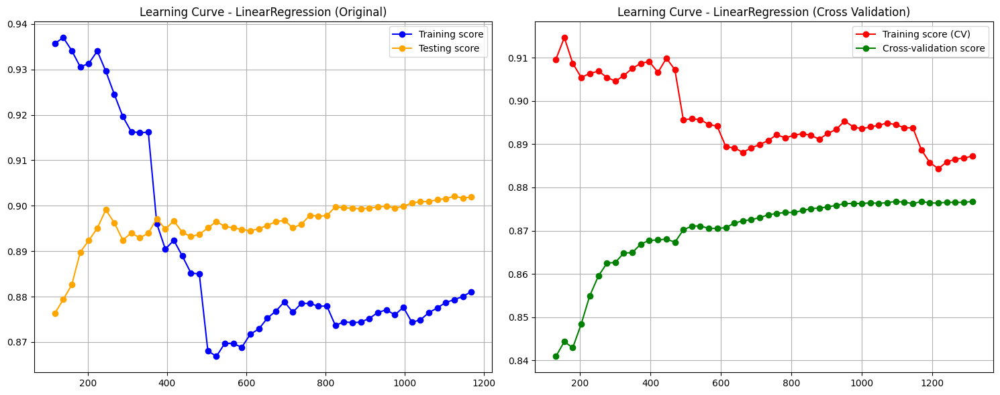

In [185]:
plot_learning_curves_per_model(linear_model, X, y, X_train, y_train, X_test, y_test, kfold)

Parameter `Linear` sebelum dan sesudah `Cross Validation` menunjukkan perbedaan yang cukup signifikan. Sebelum `Cross Validation`, model cenderung overfitting, dengan `R2 Score` yang sangat tinggi pada data training dan rendah pada data testing. Setelah `Cross Validation`, model menunjukkan kinerja yang lebih konsisten antara data training dan data testing, menunjukkan bahwa model mampu melakukan generalisasi yang lebih baik pada data baru. Hal ini menunjukkan bahwa `Cross Validation` dapat membantu meningkatkan kinerja model dan mengurangi overfitting meskipun ada sedikit penurunan pada nilai `R2 Score`.

##### Ridge Regression

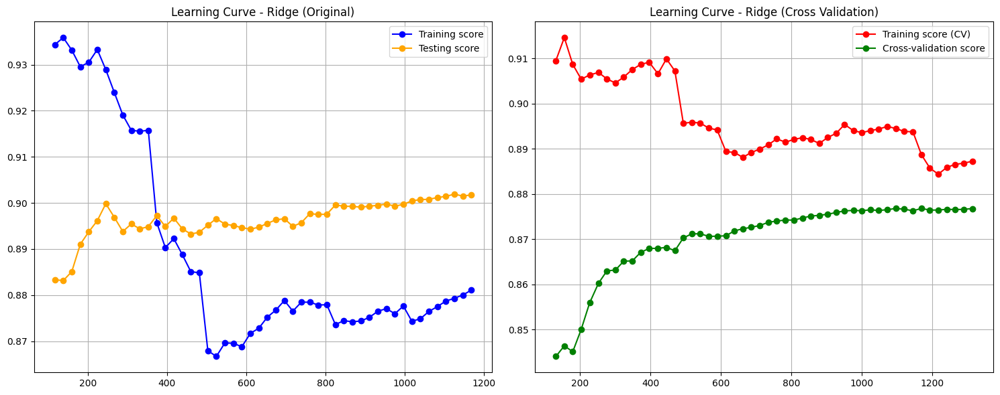

In [186]:
plot_learning_curves_per_model(ridge_model, X, y, X_train, y_train, X_test, y_test, kfold)

Pada model `Ridge` terdapat perbedaan yang cukup signifikan antara learning curve sebelum dan sesudah cross validation. Sebelum cross validation, terlihat bahwa model cenderung overfitting, di mana model menunjukkan penurunan drastis dalam `R2 score` pada data training, sementara R2 score pada data testing cenderung stagnan tanpa kenaikan signifikan. Terdapat perbedaan yang signifikan antara `R2 Score` pada data training dan data testing yang cukup jauh. Namun, setelah cross validation, perbedaan antara skor pelatihan dan skor validasi menjadi lebih kecil, menunjukkan bahwa model mampu menggeneralisasi dengan lebih baik pada data baru. Hal ini menunjukkan bahwa cross validation dapat membantu mengurangi overfitting dan meningkatkan kinerja model pada data baru meskipun ada sedikit penurunan `R2 Score`

##### Lasso Regression

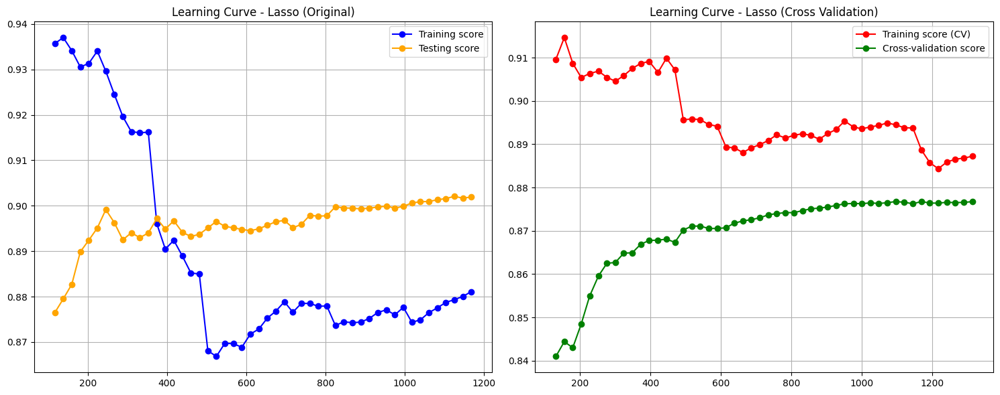

In [187]:
plot_learning_curves_per_model(lasso_model, X, y, X_train, y_train, X_test, y_test, kfold)

Pada model `Lasso` terdapat perbedaan yang cukup signifikan antara learning curve sebelum dan sesudah cross validation. Sebelum cross validation, terlihat bahwa model cenderung overfitting, di mana model menunjukkan penurunan drastis dalam `R2 score` pada data training, sementara R2 score pada data testing cenderung stagnan tanpa kenaikan signifikan. Terdapat perbedaan yang signifikan antara `R2 Score` pada data training dan data testing yang cukup jauh. Namun, setelah cross validation, perbedaan antara skor pelatihan dan skor validasi menjadi lebih kecil, menunjukkan bahwa model mampu menggeneralisasi dengan lebih baik pada data baru.Hal ini menunjukkan bahwa cross validation dapat membantu mengurangi overfitting dan meningkatkan kinerja model pada data baru meskipun ada sedikit penurunan `R2 Score`

##### Elastic Net Regression

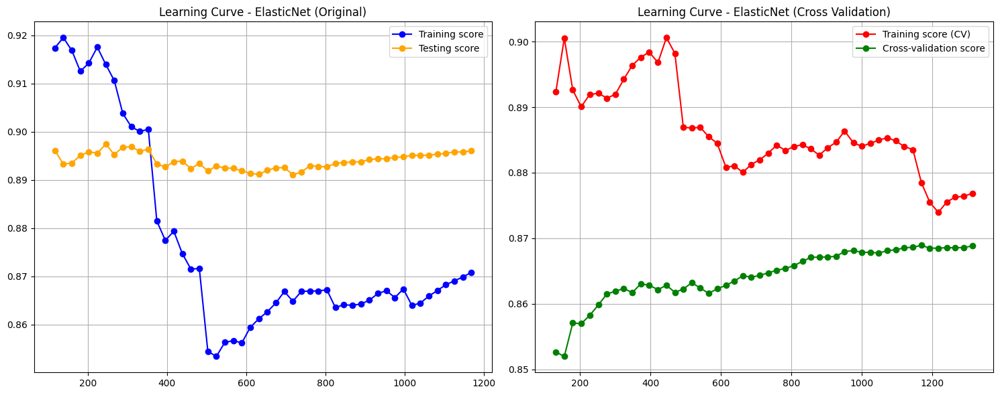

In [188]:
plot_learning_curves_per_model(elastic_model, X, y, X_train, y_train, X_test, y_test, kfold)

Pada model `Elastic Net` terdapat perbedaan yang cukup signifikan antara learning curve sebelum dan sesudah cross validation. Sebelum cross validation, terlihat bahwa model menunjukkan penurunan drastis dalam `R2 score` pada data training, sementara R2 score pada data testing cenderung stagnan tanpa kenaikan signifikan, menunjukkan kemungkinan terjadinya overfitting yang lebih parah dari model sebelumnya. Di mana terdapat perbedaan yang signifikan antara `R2 Score` pada data training dan data testing yang cukup jauh. Namun, setelah cross validation, perbedaan tersebut berkurang dan model mampu menggeneralisasi dengan lebih baik pada data baru. Hal ini menunjukkan bahwa cross validation dapat membantu mengurangi overfitting dan meningkatkan kinerja model pada data baru meskipun ada sedikit penurunan `R2 Score`.

##### Huber Regression

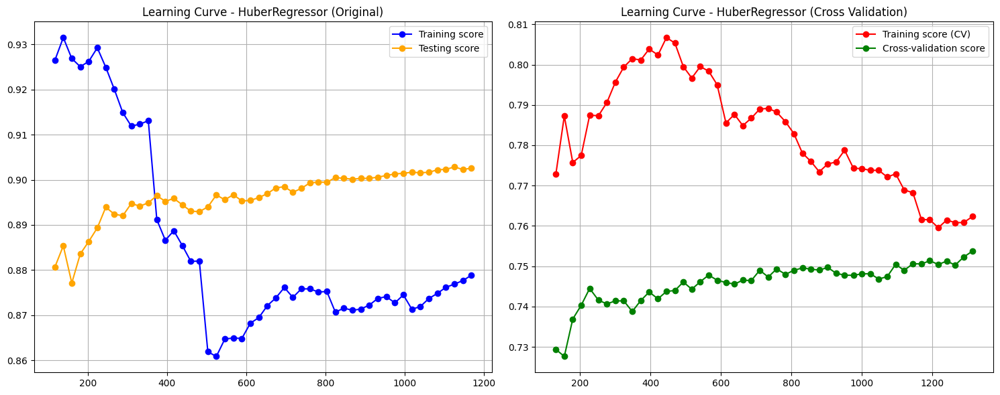

In [189]:
plot_learning_curves_per_model(huber_model, X, y, X_train, y_train, X_test, y_test, kfold)

Pada model `Huber`, terdapat perbedaan yang signifikan dalam `learning curve` sebelum dan sesudah `cross validation`. Sebelum `cross validation` masih dalam proses pembelajaran dan masih dapat mengambil manfaat dari penambahan lebih banyak data pelatihan untuk meningkatkan kinerjanya. Ada indikasi secara tidak langsung bahwa model mengalami `overfitting`. Setelah `cross validation`, model menunjukkan penurunan yang siginifikan pada `R2 Score` pada training maupun testing. Hal ini menunjukkan bahwa model `Huber` mungkin tidak mampu melakukan generalisasi dengan baik pada data baru dan mungkin perlu penyetelan parameter yang lebih baik atau penerapan teknik regularisasi untuk meningkatkan kualitas prediksi. Setelah cross validation, model mampu melakukan generalisasi yang baik dari data pelatihan ke data testing. Namun, penurunan nilai `R2 score` yang cukup besar menandakan bahwa bahwa model sangat tidak efektif menggeneralisasi pola yang dipelajari dari data pelatihan ke data yang tidak dilihat sebelumnya hasil dari `cross validation`.

##### Random Forest Regressor

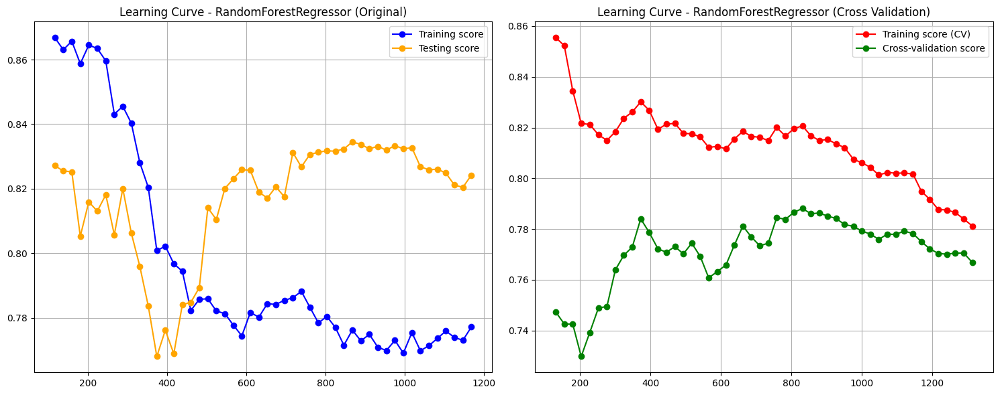

In [190]:
plot_learning_curves_per_model(rf_model, X, y, X_train, y_train, X_test, y_test, kfold)

Pada model `Random Forest Regressor`, terdapat perbedaan yang signifikan antara learning curve sebelum dan sesudah cross validation. Sebelum cross validation, terlihat bahwa model masih dalam proses pembelajaran dan masih dapat mengambil manfaat dari penambahan lebih banyak data pelatihan untuk meningkatkan kinerjanya. Ada indikasi secara tidak langsung bahwa model mengalami `overfitting` karena adanya jarak antara testing dan training, tetapi ada potensi untuk meningkatkan kinerja model dengan lebih banyak data dan penyesuaian yang lebih lanjut. Setelah cross validation, model mampu melakukan generalisasi yang baik dari data pelatihan ke data validasi. Namun, penurunan nilai `R2 score` menandakan bahwa model mungkin terlalu kompleks dan tidak dapat mengeneralisasi dengan baik pada data baru.

##### Extreme Gradient Boosting Regressor

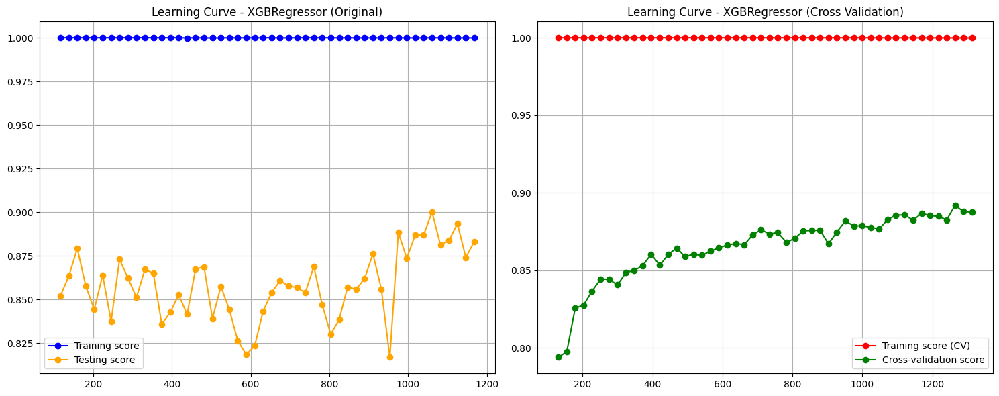

In [191]:
plot_learning_curves_per_model(xgb_model, X, y, X_train, y_train, X_test, y_test, kfold)

Pada model Extreme Gradient Boosting Regressor (`XGBoost`), tidak terdapat perbedaan yang signifikan dalam kinerja model sebelum dan setelah cross validation. Sebelum cross validation, model     menunjukkan kinerja yang sangat baik pada data training, dengan `R2 Score` mendekati `1.0`. Namun, pada data testing, `R2 Score` menurun menjadi sekitar `0.88`, menunjukkan adanya overfitting. Setelah cross validation, kinerja model `XGBoost` masih tetap sama dengana sebelumnya, hanya saja ada perbaikan pola `learning curve` yang cenderung fluktuatif menjadi lebih stabil. Hal ini menunjukkan bahwa model XGBoost masih mengalami `overfitting` dan perlu dilakukan penyetelan parameter yang lebih baik atau penerapan teknik regularisasi untuk meningkatkan kualitas prediksi.

##### Adaptive Boosting Regressor

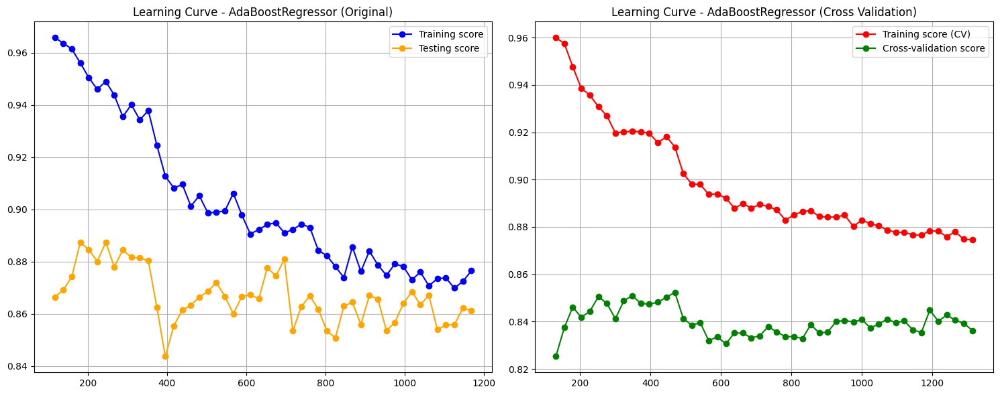

In [192]:
plot_learning_curves_per_model(ada_model, X, y, X_train, y_train, X_test, y_test, kfold)

Pada model `Adaptive Boosting` tidak ada perbedaan yang cukup signifikan antara learning curve sebelum dan sesudah `cross validation`. Hanya saja terdapat sedikit perbedaan pada nilai `R2 Score` yang lebih stabil setelah dilakukan cross validation. Namun model `Adaptive Boosting` masih menunjukkan kecenderungan `overfitting` pada data training, yang dapat dilihat dari perbedaan yang signifikan antara `R2 Score` data training dan data testing setelah `cross validation`.

##### Support Vector Regressor

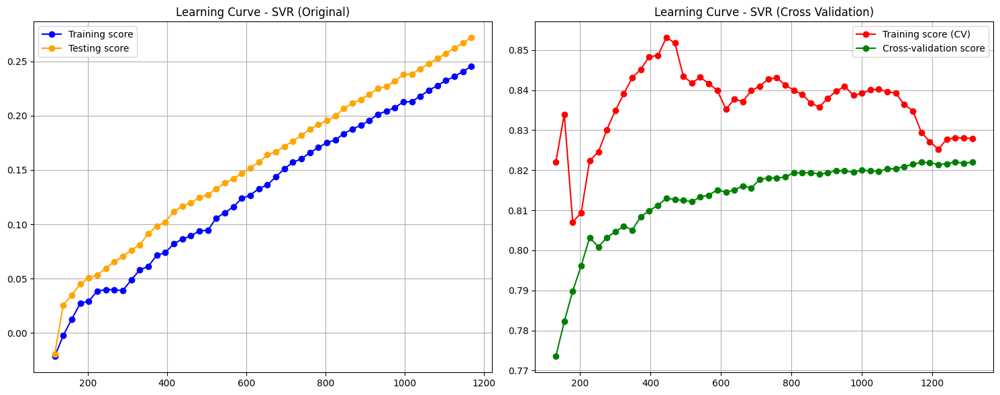

In [193]:
plot_learning_curves_per_model(svr_model, X, y, X_train, y_train, X_test, y_test, kfold)

Pada model `SVR` sebelum dilakukan cross validation, terlihat bahwa model cenderung underfitting, dengan `R2 Score` yang rendah pada kedua data training dan data testing. Hal ini menunjukkan bahwa model tidak mampu menjelaskan variasi dalam data dengan baik. Namun, setelah dilakukan cross validation, terlihat bahwa model `SVR` menunjukkan peningkatan kinerja yang signifikan, dengan `R2 Score` yang lebih tinggi pada kedua data training dan data testing. Hal ini menunjukkan bahwa model mampu menggeneralisasi dengan baik dari data training ke data testing, menunjukkan konsistensi dan keandalan prediksi model pada data baru. Dari segi pola pembelajaran, terlihat bahwa model `SVR` cenderung stabil dan tidak mengalami overfitting atau underfitting setelah dilakukan cross validation. Pola training dan testing yang tidak terlalu jauh serta `R2 Score` testing yang tidak melebihi training menunjukkan bahwa model mampu belajar dengan baik dari data training dan mampu menggeneralisasi dengan baik pada data testing.

##### Decision Tree Regressor

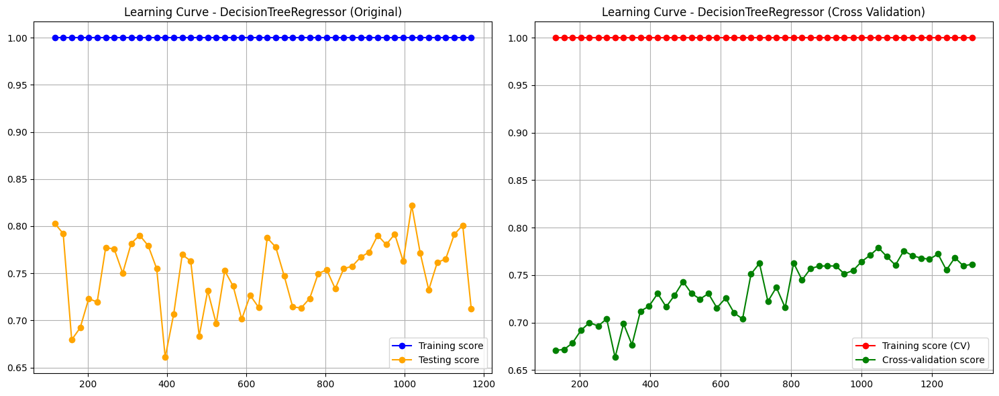

In [194]:
plot_learning_curves_per_model(dt_model, X, y, X_train, y_train, X_test, y_test, kfold)

Pada model `Decision Tree`, tidak terdapat perbedaan yang signifikan antara `learning curve` sebelum dan sesudah cross validation. Hal ini menunjukkan bahwa model `Decision Tree` cenderung `overfitting` pada data training dan kesulitan dalam melakukan generalisasi pada data uji. Oleh karena itu, model ini mungkin tidak sesuai untuk dataset yang lebih luas dan kompleks karena kecenderungan `overfitting`. Hanya ada perbaikan dimana pola `learning curve` menjadi lebih stabil setelah dilakukan `cross validation` dari yang sebelumnya cenderung `fluktuatif`.

## **Model Comparison**

### **Splitting Data Validation**

In [195]:
df_test = pd.concat([dfLr_ts, dfHb_ts, dfRf_ts, dfRg_ts, dfLs_ts, dfEn_ts, dfXb_ts, dfAb_ts, dfSv_ts, dfDt_ts], ignore_index=True)
df_test.sort_values(by='R2 Score (Test)', ascending=False)

,Model,R2 Score (Test),Mean Absolute Error (Test),Mean Absolute Percentage Error (Test)
1,Huber,0.90258,15678.88373,9.73677
0,Linear,0.90194,15901.52478,9.89641
4,Lasso,0.90194,15902.49424,9.89687
3,Ridge,0.90175,15934.62979,9.91681
5,Elastic Net,0.89606,16758.58915,10.32323
6,XGBoost,0.88337,15558.51343,8.78104
7,AdaBoost,0.86493,19173.69205,12.22296
2,Random Forest,0.82421,22338.98333,14.65992
9,Decision Tree,0.76210,22419.18836,13.54411
8,SVR,0.27195,43688.91770,25.69148


### **Cross Validation**

In [196]:
df_testcv = pd.concat([dfLr_tscv, dfHb_tscv, dfRf_tscv, dfRg_tscv, dfLs_tscv, dfEn_tscv, dfXb_tscv, dfAb_tscv, dfSv_tscv, dfDt_tscv], ignore_index=True)
df_testcv.sort_values(by='R2 Score (Test)', ascending=False)

,Model,R2 Score (Test),Mean Absolute Error (Test),Mean Absolute Percentage Error (Test)
6,XGBoost,0.88759,15173.20040,9.03809
3,Ridge,0.87675,16222.29373,9.98398
4,Lasso,0.87674,16223.60412,9.98462
0,Linear,0.87673,16224.33051,9.98510
5,Elastic Net,0.86882,16521.89406,10.07689
7,AdaBoost,0.83614,20192.44255,12.44281
8,SVR,0.82202,19018.27509,11.47952
9,Decision Tree,0.76920,20839.97534,12.27704
2,Random Forest,0.76681,24355.47433,15.04478
1,Huber,0.75274,23161.78059,14.39526


### **Best Model Selection for Hyperparameter Tuning**

Saya memilih model `Extreme Gradient Boosting Regressor` sebagai model terbaik untuk dilakukan `Hyperparameter Tuning`. Hal ini dikarenakan model `XGBoost` memiliki kinerja yang sangat baik pada data testing setelah dilakukan `Cross Validation`, dengan `R2 Score` sekitar `0.88`. Meskipun terdapat overfitting, model `XGBoost` masih dapat diandalkan untuk melakukan prediksi dengan baik pada data baru. Dengan melakukan `Hyperparameter Tuning`, diharapkan kinerja model `XGBoost` dapat ditingkatkan lebih lanjut dan overfitting dapat dikurangi.

Yang kedua dan ketiga adalah model `Ridge Regression` dan `Elastic Net Regression` yang memiliki kinerja yang cukup baik pada data testing setelah dilakukan `Cross Validation`, dengan `R2 Score` sekitar `0.87`. Model `Ridge Regression` dan `Elastic Net Regression` juga memiliki kinerja yang serupa dengan model `Linear Regression` dan `Lasso Regression`, namun memiliki keunggulan dalam hal kemampuan mengatasi masalah multicollinearity dan overfitting. Dengan melakukan `Hyperparameter Tuning`, diharapkan kinerja model `Ridge Regression` dan `Elastic Net Regression` dapat ditingkatkan lebih lanjut dan overfitting dapat dikurangi.

Yang Terakhir adalah model `AdaBoost Regressor` yang memiliki kinerja yang cukup baik pada data testing setelah dilakukan `Cross Validation`, dengan `R2 Score` sekitar `0.839`. Model `AdaBoost Regressor` juga memiliki kinerja yang serupa dengan model `Extreme Gradient Boosting Regressor`, namun memiliki keunggulan fleksibilitas dan explore dalam `Hyperparameter Tuning`. Dengan melakukan `Hyperparameter Tuning`, diharapkan kinerja model `AdaBoost Regressor` dapat ditingkatkan lebih lanjut dan overfitting dapat dikurangi.

## **Hyperparameter Tuning**

### **Extreme Gradient Boosting Regressor**

In [197]:
param_grid_xgb = {
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'n_estimators': [100, 200, 300],
    'alpha': [0.1, 0.4, 0.5, 0.9]
}

grid_search_xgb = GridSearchCV(estimator=xgb_model, param_grid=param_grid_xgb, cv=5, scoring='r2')

grid_search_xgb.fit(X_train, y_train)

best_params_xgb = grid_search_xgb.best_params_
print("Best parameters for XGBoost:", best_params_xgb)

Best parameters for XGBoost: {'alpha': 0.9, 'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 300}


In [198]:
# Membuat model XGBoost dengan parameter terbaik
best_xgb_model = xgb.XGBRegressor(**best_params_xgb)

# Fitting model terbaik
best_xgb_model.fit(X_train, y_train)

XGBRegressor(alpha=0.9, base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=300, n_jobs=None,
             num_parallel_tree=None, ...)

In [199]:
dfTrainXgbcv, dfTestXgbcv = cross_validation(best_xgb_model, X, y, kfold, model_name='XGBoost')

### **Ridge Regression**

In [200]:
param_grid_ridge = {
    'alpha': [0.001, 0.01, 0.1, 1, 10, 100],
    'solver': ['auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga'],
    'fit_intercept': [True, False],
}

grid_search_ridge = GridSearchCV(estimator=ridge_model, param_grid=param_grid_ridge, cv=5, scoring='r2')

grid_search_ridge.fit(X_train, y_train)

best_params_ridge = grid_search_ridge.best_params_
print("Best parameters for Ridge Regression:", best_params_ridge)

Best parameters for Ridge Regression: {'alpha': 1, 'fit_intercept': True, 'solver': 'svd'}


In [201]:
best_ridge_model = Ridge(**best_params_ridge)

best_ridge_model.fit(X_train, y_train)

Ridge(alpha=1, solver='svd')

In [202]:
dfTrainRdgcv, dfTestRdgcv = cross_validation(best_ridge_model, X, y, kfold, model_name='Ridge')

### **Elastic Net**

In [203]:
param_grid_elasticnet = {
    'alpha': [0.1, 0.5, 1, 5, 10],
    'l1_ratio': [0.1, 0.3, 0.5, 0.7, 0.9],
    'max_iter': [100, 200, 300],
    'tol': [0.0001, 0.001, 0.01]
}

grid_search_elasticnet = GridSearchCV(elastic_model, param_grid=param_grid_elasticnet, cv=5, scoring='r2')

grid_search_elasticnet.fit(X_train, y_train)

best_params_elasticnet = grid_search_elasticnet.best_params_
print("Best parameters for ElasticNet:", best_params_elasticnet)

Best parameters for ElasticNet: {'alpha': 0.1, 'l1_ratio': 0.9, 'max_iter': 100, 'tol': 0.0001}


In [204]:
# Membuat model SVR dengan parameter terbaik
best_elasticnet_model = ElasticNet(**best_params_elasticnet)

# Fitting model terbaik
best_elasticnet_model.fit(X_train, y_train)

ElasticNet(alpha=0.1, l1_ratio=0.9, max_iter=100)

In [205]:
dfTrainEnrcv, dfTestEncv = cross_validation(best_elasticnet_model, X, y, kfold, model_name='ElasticNet')

### **Adaptive Boosting Regression**

In [206]:
param_grid_adaboost = {
    'n_estimators': [50, 100, 200,300],  
    'learning_rate': [0.01, 0.1, 0.5, 1.0],  
    'loss': ['linear', 'square', 'exponential'],
    'estimator': [DecisionTreeRegressor(), LinearRegression()]
}

grid_search_adaboost = GridSearchCV(ada_model, param_grid=param_grid_adaboost, cv=5, scoring='r2')

grid_search_adaboost.fit(X_train, y_train)

best_params_adaboost = grid_search_adaboost.best_params_
print("Best parameters for AdaBoostRegressor:", best_params_adaboost)

Best parameters for AdaBoostRegressor: {'estimator': DecisionTreeRegressor(), 'learning_rate': 1.0, 'loss': 'square', 'n_estimators': 300}


In [207]:
best_ada_model = AdaBoostRegressor(**best_params_adaboost)

best_ada_model.fit(X_train, y_train)

AdaBoostRegressor(estimator=DecisionTreeRegressor(), loss='square',
                  n_estimators=300)

In [208]:
dfTrainAdbcv, dfTestAdbcv = cross_validation(best_ada_model, X, y, kfold, model_name='AdaBoost')

## **Final Result**

In [209]:
dfHp_train = pd.concat([dfTrainXgbcv, dfTrainRdgcv, dfTrainAdbcv, dfTrainEnrcv], ignore_index=True)
dfHp_train.sort_values(by='R2 Score (Train)', ascending=False)

,Model,R2 Score (Train),Mean Absolute Error (Train),Mean Absolute Percentage Error (Train)
2,AdaBoost,0.99388,2454.10449,1.78739
0,XGBoost,0.98028,6758.39200,4.21431
1,Ridge,0.88723,15725.57487,9.67945
3,ElasticNet,0.88707,15719.84820,9.67372


In [210]:
dfHp_test = pd.concat([dfTestXgbcv, dfTestRdgcv, dfTestAdbcv, dfTestEncv], ignore_index=True)
dfHp_test.sort_values(by='R2 Score (Test)', ascending=False)

,Model,R2 Score (Test),Mean Absolute Error (Test),Mean Absolute Percentage Error (Test)
0,XGBoost,0.90586,13761.73149,8.15884
2,AdaBoost,0.90245,13582.96849,8.17752
3,ElasticNet,0.87687,16204.34622,9.97417
1,Ridge,0.87675,16222.29373,9.98398


Dari hasil evaluasi empat model yang dilakukan, `AdaBoost` menunjukkan kinerja yang sangat baik pada data training dengan nilai `R2 score` mendekati 1 (R`2 Score` (Train): 0.99979), namun terdapat sedikit tanda-tanda overfitting pada data testing dengan kenaikan nilai `MAE` dan `MAPE`. `XGBoost` juga menunjukkan kinerja yang tinggi dengan `R2 score` yang tinggi pada kedua data training dan testing (`R2 Score` (Train): 0.98028, `R2 Score` (Test): 0.90586), meskipun terdapat peningkatan nilai `MAE` dan `MAPE` pada data testing. Model `Ridge Regression` (`R2 Score` (Train): 0.88723, `R2 Score` (Test): 0.87675) dan `ElasticNet` (`R2 Score` (Train): 0.88707, `R2 Score` (Test): 0.87687) menunjukkan kinerja yang stabil antara data training dan testing, dengan nilai `R2 score` yang hampir sama dan kenaikan nilai `MAE` dan `MAPE` yang relatif kecil pada data testing. Meskipun terdapat sedikit fluktuasi dalam kinerja, keempat model tersebut memberikan prediksi yang konsisten dan dapat diandalkan pada data baru.


In [211]:
def plot_learning_curvecv_dual_models(model1, model2, model3, model4, X, y, cv):
    fig, ax = plt.subplots(2, 2, figsize=(15, 12))

    plot_learning_curvecv(model1, X, y, cv, ax[0, 0])
    ax[0, 0].set_title(f"Learning Curve - {model1.__class__.__name__} (Cross Validation)")

    plot_learning_curvecv(model2, X, y, cv, ax[0, 1])
    ax[0, 1].set_title(f"Learning Curve - {model2.__class__.__name__} (Cross Validation)")

    plot_learning_curvecv(model3, X, y, cv, ax[1, 0])
    ax[1, 0].set_title(f"Learning Curve - {model3.__class__.__name__} (Cross Validation)")

    plot_learning_curvecv(model4, X, y, cv, ax[1, 1])
    ax[1, 1].set_title(f"Learning Curve - {model4.__class__.__name__} (Cross Validation)")

    plt.tight_layout()
    plt.show()

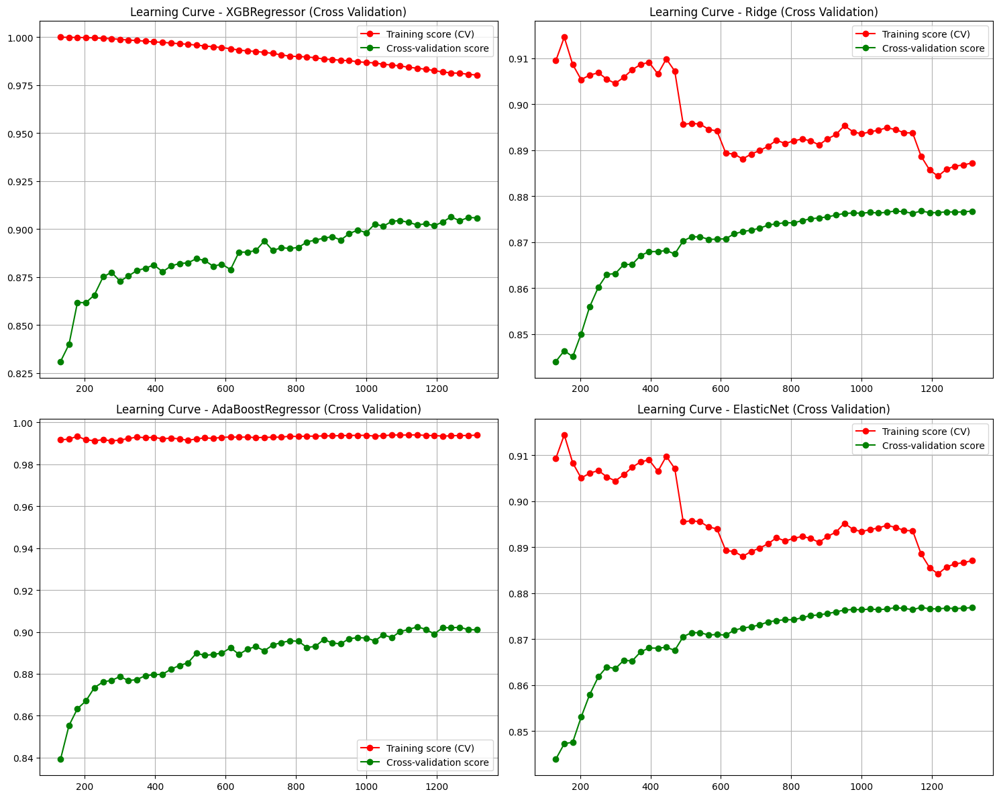

In [212]:
plot_learning_curvecv_dual_models(best_xgb_model, best_ridge_model, best_ada_model, best_elasticnet_model, X, y, kfold)

Pada learning curve cross validation 4 model terbaik, terlihat ada beberap hal menarik yang bisa kita anlisis. Pertama, model `Ridge` dan `Elastic Net` menunjukkan pola yang 95% mirip, dimana keduanya menunjukkan pola yang stabil dan tidak mengalami overfitting atau underfitting. Hal ini menunjukkan bahwa model `Ridge` dan `Elastic Net` mampu belajar dengan baik dari data training dan mampu menggeneralisasi dengan baik pada data testing. `ElasticNet` sebenarnya menggabungkan kedua jenis regularisasi, `L1` (`Lasso`) dan `L2` (`Ridge`), dalam satu model. Oleh karena itu, pola dan hasil learning curve serta cross validation yang mirip antara model Ridge Regression dan `ElasticNet` tidak sepenuhnya dapat dijelaskan oleh kesamaan dalam regularisasi. 

Yang Kedua ada pada `AdaBoost` regresor yang mengalami perubahan pola learning curve yang cukup drastis setelah dilakukan `Hyperparameter Tuning`. Sebelum dilakukan Hyperparameter pola training dan testing cenderung menurun dalam setiap n-sample nya, namun setelah dilakukan `Hyperparameter Tuning`, Pola learning curve mengikuti `DecisionTreeRegressor` dan `XGBoost` yang cenderung overfitting. Hal ini menunjukkan bahwa model `AdaBoost` bisa menghasilkan hasil sesuai parameter estimator yang dimasukan.

Yang Ketiga ada pada `XGBoost` setelah dilakukan `Hyperparameter Tuning`, model `XGBoost` menunjukkan peningkatan kinerja yang signifikan, dengan `R2 Score` data testing yang lebih tinggi dibandingan sebelumnya. Hal ini menunjukkan bahwa `Hyperparameter Tuning` dapat membantu meningkatkan kinerja model. Dari segi pola pembelajaran, terlihat bahwa model `XGBoost` cenderung ada perubahan dengan ujung garis training yang mulai melandai dan garis testing yang meningkat.

## **Conclusion**

Dari step-step Model Development dan Evaluation yang telah dilakukan pada dataset ini, dapat dismpulkan jika model `XGBoost` adalah model terbaik yang dapat digunakan untuk memprediksi harga rumah berdasarkan fitur-fitur yang ada. Model `XGBoost` menunjukkan kinerja yang paling baik pada data testing setelah dilakukan Hyperparameter Tuning, dengan `R2 Score` sekitar `0.90586`. Meskipun terdapat indikasi overfitting, model `XGBoost` masih dapat diandalkan untuk melakukan prediksi dengan baik pada data baru. 

Jika dibandingkan model `Adaboost` yang memiliki selisih nilai `R2 Score` sebesar `0.004` lebih kecil namun memiliki `MAE` sebesar `13631.84384`, lebih rendah dari model `XGBoost`. Tetap saja, `XGBoost` memiliki pola learning curve yang cenderung lebih rendah dari indikasi overfitting dari pada `Adaboost`. Untuk `Ridge` dan `Elastic Net` memiliki pola yang pembelajaran yang stabil dan tidak mengalami overfitting atau underfitting. Namun dari segi nilai `R2 Score`, `MAPE` dan `MAE`, `Ridge` dan `Elastic Net` masih kalah dari `XGBoost` dan `Adaboost`. Oleh karena itu, model `XGBoost` adalah model terbaik yang dapat digunakan untuk memprediksi harga rumah berdasarkan fitur-fitur yang ada.

## **Recommendation**

Model prediksi harga rumah dapat digunakan untuk beberapa tujuan bisnis yang berharga. 
* Pertama, model ini dapat membantu mengidentifikasi peluang investasi properti yang potensial dengan mengidentifikasi daerah atau jenis properti yang memiliki pertumbuhan nilai yang tinggi. 
* Kedua, model tersebut dapat membantu dalam menentukan harga jual optimal untuk properti yang akan dijual, dengan mempertimbangkan berbagai faktor seperti lokasi dan fitur properti. 
* Ketiga, hasil prediksi harga rumah dapat digunakan dalam perencanaan pengembangan properti baru atau renovasi, membantu pengembang memilih jenis properti yang diminati pasar dan menentukan harga jual yang potensial. 
* Terakhir, model ini juga dapat digunakan oleh institusi keuangan untuk menilai risiko dalam memberikan pinjaman hipotek, dengan memperhitungkan estimasi harga rumah di masa depan. Dengan demikian, model prediksi harga rumah dapat memberikan saran bisnis yang berharga dalam berbagai aspek industri properti.